# Exploratory analysis on GRN (TDR118)

- We will generate exploratory plots from the inferred GRN (TDR118 in this noteobok)
- At the end of this notebook, we will sort out the useful plots, then clean up this notebook.

Ideas
- number of target, source TFs, pairs of target gene - source TFs
- degree centrality, etc. - network/graph theory properties

In [2]:
# 0. Import

import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

ModuleNotFoundError: No module named 'scanpy'

In [42]:
import celloracle as co
co.__version__

'0.14.0'

In [4]:
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300


In [5]:
figpath_def = "/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/zebrahub-multiome-analysis/figures/"
save_folder = "network_plots_TDR118"
os.makedirs(figpath_def + save_folder, exist_ok=True)

# define the figure path
figpath = figpath_def + save_folder



# Step1. Import the base GRN

CellOracle object contains the following fields:
- scRNA-seq dataset used to infer the GRN: adata
- base GRN: TFinfo_df
- cluster-specific (cell-type-specific) GRNs: oracle.links

In [6]:
# Load the base GRN - TF info which was made from our own zebrafish single-cell multiome dataset (15-somite)
TFinfo_df = pd.read_parquet("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/TDR118_cicero_output/05_TDR118_base_GRN_dataframe.parquet")

# Check data
TFinfo_df.head()

,peak_id,gene_short_name,A6H8I1_DANRE,CABZ01017151.1,CABZ01056727.1,CABZ01057488.2,CABZ01066696.1,CABZ01067175.1,CABZ01079847.1,CABZ01081359.1,...,znf143b,znf148,znf281a,znf281b,znf652,znf653,znf711,znf740b,znf76,zzz3
0,chr10_10310135_10311044,mir219-1,0,0,1,0,0,1,0,0,...,0,1,1,1,0,0,0,0,0,0
1,chr10_10312654_10313520,urm1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,chr10_10318857_10319768,mir219-1,0,0,1,1,0,1,0,0,...,0,1,1,1,0,0,0,0,0,0
3,chr10_10330150_10331040,mir219-1,1,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,chr10_10728430_10729439,swi5,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
gene_names = TFinfo_df.gene_short_name
gene_names

0        mir219-1
1            urm1
2        mir219-1
3        mir219-1
4            swi5
           ...   
14506      gsk3ba
14507      fstl1b
14508       prmt2
14509      ugt1a1
14510      ugt1a6
Name: gene_short_name, Length: 14511, dtype: object

In [8]:
TF_names = TFinfo_df.columns
TF_names

Index(['peak_id', 'gene_short_name', 'A6H8I1_DANRE', 'CABZ01017151.1',
       'CABZ01056727.1', 'CABZ01057488.2', 'CABZ01066696.1', 'CABZ01067175.1',
       'CABZ01079847.1', 'CABZ01081359.1',
       ...
       'znf143b', 'znf148', 'znf281a', 'znf281b', 'znf652', 'znf653', 'znf711',
       'znf740b', 'znf76', 'zzz3'],
      dtype='object', length=869)

In [20]:
gene_names_are_TF = gene_names[gene_names.isin(TF_names)]
gene_names_are_TF = gene_names_are_TF.unique()
gene_names_are_TF

array(['erg', 'bach1b', 'pnx', 'bsx', 'pknox2', 'hic2', 'foxo1b', 'smad9',
       'tcf7l1a', 'mef2ca', 'nr2f1b', 'ved', 'nfil3', 'smad4a', 'rfx3',
       'isl1l', 'lhx6', 'sp2', 'mybl2b', 'fezf2', 'rargb', 'hoxc13b',
       'hoxc12b', 'hoxc6b', 'foxp4', 'tfeb', 'myog', 'sox12', 'snai1a',
       'gata1a', 'mafbb', 'foxj3', 'barx1', 'sp1', 'bhlhe40', 'nfya',
       'sox13', 'elk4', 'gata2a', 'pax7a', 'foxg1b', 'gli2b', 'mafgb',
       'nr2f6b', 'pparg', 'sox8a', 'raraa', 'irf9', 'neurod2', 'znf281b',
       'bhlha15', 'si:dkey-7e14.3', 'tefa', 'maff', 'sox9a', 'foxj1b',
       'foxn2b', 'six3b', 'six2b', 'zeb1b', 'hoxb8b', 'hoxb6b', 'hoxb5b',
       'hoxb1b', 'meox1', 'etv4', 'tbx21', 'nfe2l1b', 'tcf7l2', 'hlfb',
       'foxk2', 'ebf3a', 'foxi1', 'pax2b', 'dlx3b', 'dlx4b', 'egr2b',
       'six2a', 'six3a', 'zbtb18', 'foxi2', 'noto', 'emx1', 'ikzf1',
       'emx2', 'mxtx1', 'tbp', 'msx3', 'atoh7', 'foxg1d', 'neurog3',
       'rel', 'bcl11aa', 'tlx1', 'lbx1a', 'pax2a', 'drgx', 'irf1a',
   

In [161]:
# TFinfo_df.columns.isin(gene_names_are_TF)

In [59]:
# filter for the rows - only genes that are "TFs"
TFinfo_df_TFonly = TFinfo_df[TFinfo_df.gene_short_name.isin(gene_names_are_TF)]
TFinfo_df_TFonly

,peak_id,gene_short_name,A6H8I1_DANRE,CABZ01017151.1,CABZ01056727.1,CABZ01057488.2,CABZ01066696.1,CABZ01067175.1,CABZ01079847.1,CABZ01081359.1,...,znf143b,znf148,znf281a,znf281b,znf652,znf653,znf711,znf740b,znf76,zzz3
73,chr10_167765_168462,erg,0,0,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
173,chr10_25369340_25370090,bach1b,1,1,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
204,chr10_2798778_2799686,pnx,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
229,chr10_29892298_29893169,bsx,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
234,chr10_31175807_31176719,pknox2,0,0,0,1,0,0,0,0,...,0,1,1,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14412,chr9_53102357_53103256,sox21b,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
14413,chr9_53275798_53276576,sox21b,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14489,chr9_7723816_7724686,mnx2a,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14490,chr9_784549_785398,en1a,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# reindex the dataframe using the "gene_short_name"
# also, add the rows with the same "gene_short_name"


In [ ]:
# filter for the columns - only TFs that are also present in the row indices
columns_to_keep = np.concatenate(['peak_id', 'gene_short_name'], gene_names_are_TF)
TFinfo_df_TFonly.loc[:,["peak_id", "gene_short_name",TFinfo_df.columns.isin(columns_to_keep)]]

## Load the CellOracle object, and CellOracle GRN (Links object)

In [8]:
oracle = co.load_hdf5("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/TDR118_cicero_output/06_TDR118.celloracle.oracle")
oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.14.0
    n_cells: 13022
    n_genes: 3000
    cluster_name: predicted.id
    dimensional_reduction_name: X_umap
    n_target_genes_in_TFdict: 12674 genes
    n_regulatory_in_TFdict: 863 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 316 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 1637 genes
    k_for_knn_imputation: 325
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Not finished

In [9]:
info = oracle._generate_meta_data()
info

{'celloracle version used for instantiation': '0.14.0',
 'n_cells': 13022,
 'n_genes': 3000,
 'status - Gene expression matrix': 'Ready',
 'cluster_name': 'predicted.id',
 'dimensional_reduction_name': 'X_umap',
 'n_target_genes_in_TFdict': '12674 genes',
 'n_regulatory_in_TFdict': '863 genes',
 'n_regulatory_in_both_TFdict_and_scRNA-seq': '316 genes',
 'n_target_genes_both_TFdict_and_scRNA-seq': '1637 genes',
 'status - BaseGRN': 'Ready',
 'status - PCA calculation': 'Done',
 'status - Knn imputation': 'Done',
 'k_for_knn_imputation': 325,
 'status - GRN calculation for simulation': 'Not finished'}

The raw network data is stored as an attribute, **"links_dict,"** while filtered network data is stored in **"filtered_links."** 
Thus the filtering function keeps raw network information rather than overwriting the data. You can come back to the filtering process to filter the data with different parameters if you want.

Note: We filtered our GRN by using p-value<=0.001, and the top 2000 networks (based on the network "weights"?).

### links.filter_links():

- Filter network edges. In most cases, inferred GRN has non-significant random edges. We have to remove these edges before analyzing the network structure. You can do the filtering in any of the following ways.

- Filter based on the p-value of the network edge. Please enter p-value for thresholding.
- Filter based on network edge number. If you set the number, network edges will be filtered based on the order of a network score. The top n-th network edges with network weight will remain, and the other edges will be removed. The network data has several types of network weight, so you have to select which network weight do you want to use.
- Filter based on an arbitrary gene list. You can set a gene list for source nodes or target nodes.

Parameters
- p (float) – threshold for p-value of the network edge.

- weight (str) – Please select network weight name for the filtering

- genelist_source (list of str) – gene list to remain in regulatory gene nodes. Default is None.

- genelist_target (list of str) – gene list to remain in target gene nodes. Default is None.

**links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)**

In [10]:
# Load the CellOracle GRN
output_filepath = "/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/TDR118_cicero_output/"
links = co.load_hdf5(file_path=output_filepath + "08_TDR118_celltype_GRNs.celloracle.links")
links

In [11]:
# raw cell-type GRN (for all pairs of source-target, including lots of non-specific interactions)
links.links_dict["NMPs"]

,source,target,coef_mean,coef_abs,p,-logp
0,tlx3b,abi3bpb,-2.999180e-04,2.999180e-04,1.865272e-08,7.729258
1,hoxb3a,abi3bpb,8.538091e-06,8.538091e-06,6.076660e-01,0.216335
2,meis2a,abi3bpb,5.849536e-05,5.849536e-05,7.727187e-04,3.111979
3,esr2a,abi3bpb,3.399838e-06,3.399838e-06,8.685750e-01,0.061193
4,tbx16,abi3bpb,-6.620417e-06,6.620417e-06,6.388675e-01,0.194589
...,...,...,...,...,...,...
209238,sox13,zwi,9.908964e-05,9.908964e-05,7.639477e-03,2.116936
209239,sox7,zwi,-7.468860e-07,7.468860e-07,9.835044e-01,0.007224
209240,nfia,zwi,1.264570e-04,1.264570e-04,1.777613e-03,2.750163
209241,sox5,zwi,7.982593e-05,7.982593e-05,4.591966e-03,2.338001


In [13]:
# filtered cell-type specific GRN:
# (1) Remove uncertain network edges based on the p-value.
# (2) Remove weak network edge. In this tutorial, we pick up the top 2000 edges in terms of network strength.
links.filtered_links["NMPs"]

,source,target,coef_mean,coef_abs,p,-logp
171664,nfatc1,slit3,0.167520,0.167520,6.099314e-13,12.214719
166079,hmga1a,si:ch73-281n10.2,0.134133,0.134133,8.328944e-17,16.079410
171665,creb5b,slit3,0.118250,0.118250,2.857576e-08,7.544002
27748,her9,cirbpa,0.109563,0.109563,5.209617e-10,9.283194
154387,mafbb,rpl7a,0.091194,0.091194,7.477311e-13,12.126255
...,...,...,...,...,...,...
871,foxi3a,actb1,0.010103,0.010103,1.992044e-07,6.700701
40775,sox3,dag1,0.010103,0.010103,2.348269e-09,8.629252
107705,sox21a,mdka,0.010102,0.010102,4.750005e-10,9.323306
26231,otpb,cfl1,0.010096,0.010096,3.951234e-05,4.403267


In [40]:
links.filtered_links["Adaxial_Cells"]

,source,target,coef_mean,coef_abs,p,-logp
166079,hmga1a,si:ch73-281n10.2,0.104442,0.104442,7.043193e-14,13.152230
27753,sp5l,cirbpa,0.072111,0.072111,9.413705e-12,11.026239
166050,sp5l,si:ch73-281n10.2,0.065385,0.065385,7.144858e-13,12.146006
171659,fezf1,slit3,0.064806,0.064806,3.475235e-15,14.459016
27743,egr4,cirbpa,0.063309,0.063309,6.825804e-09,8.165846
...,...,...,...,...,...,...
23390,foxd5,cdh15,0.010749,0.010749,4.149559e-12,11.381998
104056,hoxa10b,lpar1,0.010749,0.010749,1.434802e-12,11.843208
74330,hoxb9a,h3f3d,0.010748,0.010748,1.592915e-07,6.797808
102267,nkx2.2a,limch1a,0.010748,0.010748,3.522194e-12,11.453187


You can check filtered network edge as follows.

# Step 2. Deeper dive into the cell-type specific GRNs 

- We will use the NMP GRN as an example to perform EDA on TF (source-target) network


In [36]:
# filter the GRN for "NMPs"
cluster_name = "NMPs"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df.head()

,source,target,coef_mean,coef_abs,p,-logp
171664,nfatc1,slit3,0.167520,0.167520,6.099314e-13,12.214719
166079,hmga1a,si:ch73-281n10.2,0.134133,0.134133,8.328944e-17,16.079410
171665,creb5b,slit3,0.118250,0.118250,2.857576e-08,7.544002
27748,her9,cirbpa,0.109563,0.109563,5.209617e-10,9.283194
154387,mafbb,rpl7a,0.091194,0.091194,7.477311e-13,12.126255


In [77]:
filtered_links_df.value_counts("source")

source
rxrab     39
hoxd3a    33
en1a      28
pax6b     27
meox1     27
          ..
tbx15      1
mef2ca     1
ar         1
runx1      1
alx4b      1
Name: count, Length: 263, dtype: int64

In [78]:
filtered_links_df.value_counts("target")

target
hmga1a      60
hsp90ab1    56
apoc1       56
ptmab       53
serbp1a     49
            ..
shdb         1
efna3b       1
hoxa9b       1
hbbe3        1
ackr3b       1
Name: count, Length: 153, dtype: int64

In [39]:
# list of genes that exist in both "source" (regulatory TF) and "target" (target gene, from peak/TSS)
filtered_links_df["source"][filtered_links_df["source"].isin(filtered_links_df["target"])].unique()

array(['hmga1a', 'lef1', 'sox5', 'sox11a', 'foxp4', 'sox6', 'raraa',
       'hoxb9a', 'sox13', 'cdx4', 'tbx16', 'hoxa9b', 'pax3a', 'rarga',
       'trps1', 'rxraa', 'rarab', 'meis1b', 'hoxc6b', 'hoxb3a', 'gli2a',
       'hoxc3a', 'hoxb7a', 'hoxc8a', 'gli3', 'arid3c'], dtype=object)

In [40]:
filtered_links_df[filtered_links_df["source"]=="sox6"]

,source,target,coef_mean,coef_abs,p,-logp
204016,sox6,zbtb16a,0.044376,0.044376,4.729181e-08,7.325214
157048,sox6,rxraa,0.014677,0.014677,1.513273e-11,10.820083
153653,sox6,robo1,0.010831,0.010831,4.538794e-10,9.343060
100986,sox6,lef1,0.010723,0.010723,3.207394e-12,11.493848


In [41]:
filtered_links_df[filtered_links_df["target"]=="sox6"]

,source,target,coef_mean,coef_abs,p,-logp
175242,sox5,sox6,0.020301,0.020301,3.165189e-08,7.499600
175243,rxraa,sox6,0.019257,0.019257,1.943779e-07,6.711353
175227,rarga,sox6,0.014781,0.014781,7.530129e-11,10.123198
175164,tbx16,sox6,0.013716,0.013716,1.288045e-11,10.890069
175193,rxrab,sox6,0.012023,0.012023,6.025556e-13,12.220003
175194,nr2f5,sox6,0.010134,0.010134,2.754665e-05,4.559931


In [43]:
# EDA on GRN - volcano plot, histogram, etc.

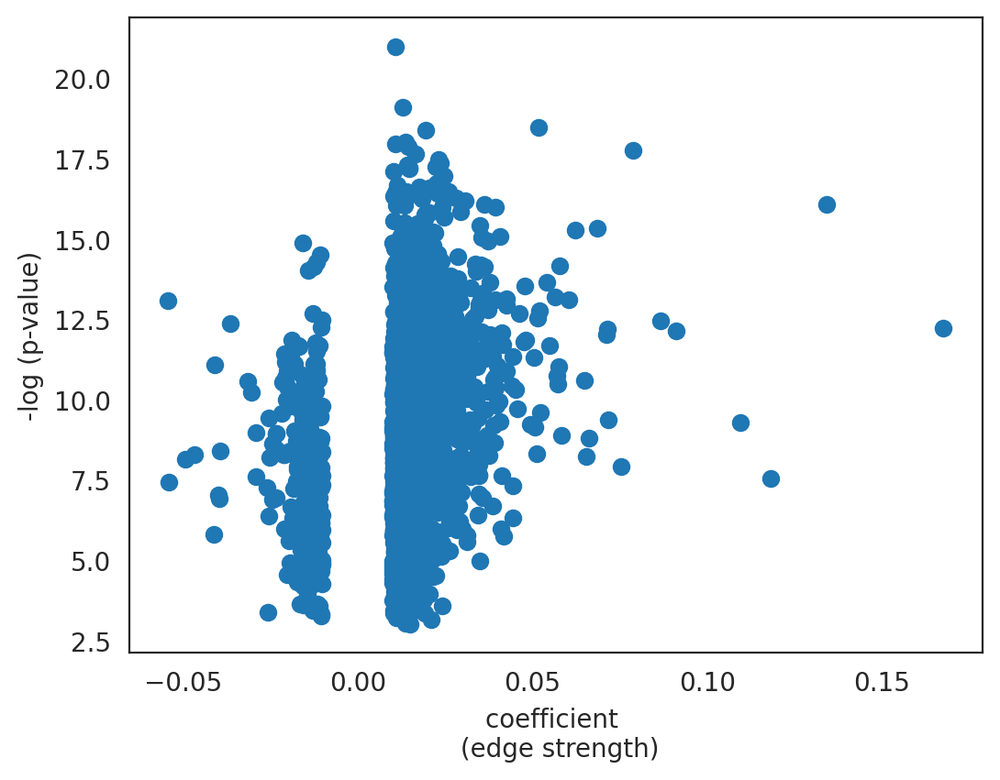

In [81]:
# Scatter plot (volcano plot) for coef_mean and -log (p-value)
plt.scatter(x=filtered_links_df["coef_mean"],
            y=filtered_links_df["-logp"])

plt.xlabel("coefficient \n (edge strength)")
plt.ylabel("-log (p-value)")
plt.savefig("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/zebrahub-multiome-analysis/figures/network_plots_TDR118/network_eda/network_coeff_logp_scatter_NMP.pdf")

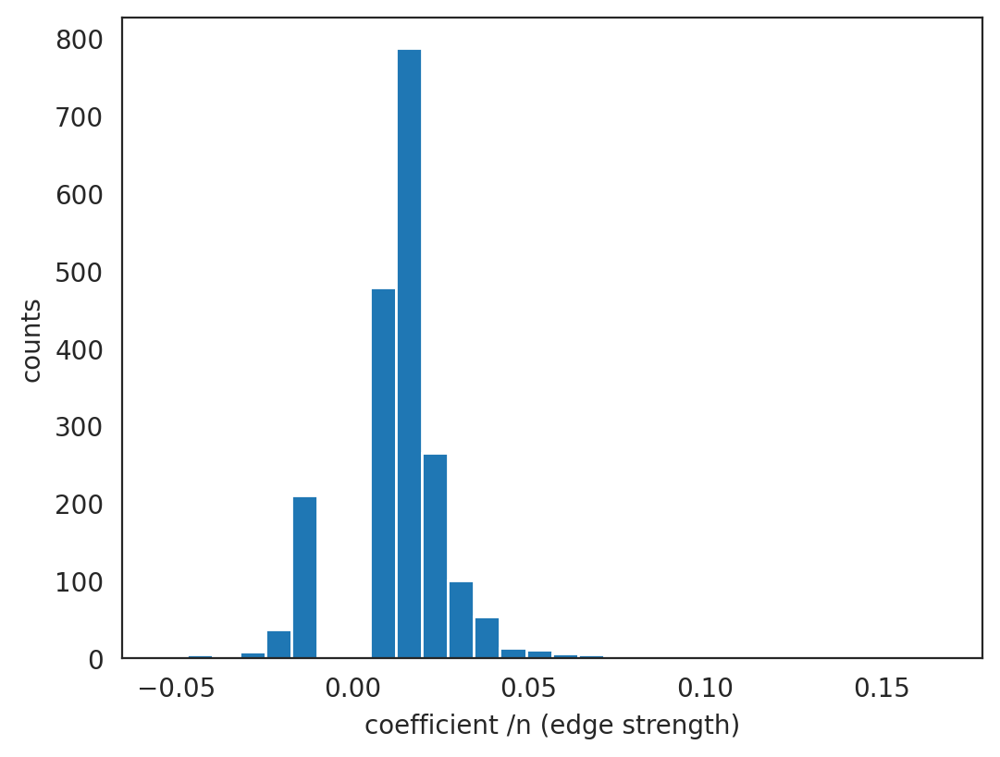

In [84]:
# histogram of coef_mean
plt.hist(filtered_links_df.coef_mean, bins=30)
plt.xlabel("coefficient /n (edge strength)")
plt.ylabel("counts")
plt.savefig("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/zebrahub-multiome-analysis/figures/network_plots_TDR118/network_eda/network_coeff_hist_NMP.pdf")

## Note
- Most of the TF (source-target) pair shows activation, rather than repression. 

In [88]:
# summary
print(filtered_links_df.info())
print(filtered_links_df.describe())

         coef_mean     coef_abs             p        -logp
count  2000.000000  2000.000000  2.000000e+03  2000.000000
mean      0.013612     0.017799  9.741468e-06     9.056861
std       0.015425     0.010313  5.721928e-05     2.982262
min      -0.054280     0.010091  1.011434e-21     3.016161
25%       0.011022     0.011956  9.239155e-12     6.804430
50%       0.013902     0.014763  1.299261e-09     8.886311
75%       0.019187     0.019750  1.568818e-07    11.034381
max       0.167520     0.167520  9.634721e-04    20.995062


In [91]:
# unique TFs
unique_tfs = pd.unique(filtered_links_df[['source', 'target']].values.ravel())
print(unique_tfs)
print(len(unique_tfs))

['nfatc1' 'slit3' 'hmga1a' 'si:ch73-281n10.2' 'creb5b' 'her9' 'cirbpa'
 'mafbb' 'rpl7a' 'fosaa' 'lef1' 'gdf11' 'foxa2' 'sox21a' 'twist1b'
 'zbtb16a' 'sox5' 'sox3' 'hnf1bb' 'nr2f5' 'hmgb2a' 'mafba' 'irx1b'
 'serbp1a' 'irx4a' 'neurod4' 'sp5l' 'sox11a' 'myf5' 'apoc1' 'rxrab'
 'fezf2' 'rorb' 'spi1b' 'nucks1a' 'meox1' 'tbx2a' 'bhlha15' 'pax2a'
 'pax1a' 'tcf7l2' 'en1a' 'rps20' 'foxp4' 'gbx2' 'nkx2.4b' 'hnrnpaba'
 'tbx2b' 'sox6' 'raraa' 'fosb' 'eef1a1l1' 'nkx1.2la' 'thrab' 'col18a1a'
 'tfap2e' 'hoxb9a' 'h3f3d' 'gata1a' 'neurod1' 'pax1b' 'nkx6.1' 'sox13'
 'esr2a' 'hmgn2' 'tfap2c' 'pax6a' 'pax6b' 'foxp1b' 'hsp90ab1' 'cux2b'
 'ved' 'ptmab' 'agrn' 'klf3' 'foxd1' 'smad1' 'etv4' 'foxn3' 'nr6a1b'
 'msx3' 'rps2' 'klf6a' 'klf2a' 'rfx4' 'vax1' 'dlx3b' 'hmgb2b' 'actb1'
 'tfap2b' 'cdx4' 'cntfr' 'tbx16' 'itm2cb' 'ntn1a' 'meis2a' 'hoxa9b' 'etv2'
 'klf12b' 'hoxd9a' 'uncx' 'foxd5' 'pax3a' 'cdon' 'esrrga' 'aopep' 'ascl1a'
 'gata5' 'hoxa11b' 'gsx2' 'irx5b' 'foxi2' 'phox2bb' 'sox1a' 'gli3' 'msna'
 'h3f3b.1' 'ho

In [92]:
# count TF occurrences: 
source_counts = filtered_links_df['source'].value_counts()
target_counts = filtered_links_df['target'].value_counts()
print(source_counts)
print(target_counts)

source
rxrab      39
hoxd3a     33
en1a       28
meox1      27
pax6b      27
           ..
hoxc11a     1
nr2e1       1
mef2ca      1
uncx4.1     1
nkx2.2b     1
Name: count, Length: 263, dtype: int64
target
hmga1a      60
hsp90ab1    56
apoc1       56
ptmab       53
serbp1a     49
            ..
arvcfb       1
tob1a        1
ptprga       1
hoxa9b       1
akap12b      1
Name: count, Length: 153, dtype: int64


In [109]:
# Find the unique transcription factors in the "source" column
all_tfs = pd.unique(filtered_links_df[['source']].values.ravel())

# Initialize lists to store activators and repressors
activators = []
repressors = []
bifunctional = []

# Check if each TF is always an activator or repressor for all targets
for tf in all_tfs:
    tf_data = filtered_links_df[filtered_links_df['source'] == tf]
    if all(tf_data['coef_mean'] > 0):
        activators.append(tf)
    elif all(tf_data['coef_mean'] < 0):
        repressors.append(tf)
    else:
        bifunctional.append(tf)

print("Activators:", activators)
print("Repressors:", repressors)
print("Bifunctional", bifunctional)

Activators: ['hmga1a', 'creb5b', 'her9', 'mafbb', 'fosaa', 'foxa2', 'sox21a', 'twist1b', 'sox5', 'sox3', 'hnf1bb', 'nr2f5', 'mafba', 'irx1b', 'irx4a', 'neurod4', 'sp5l', 'sox11a', 'myf5', 'rorb', 'spi1b', 'meox1', 'tbx2a', 'bhlha15', 'pax2a', 'tcf7l2', 'en1a', 'nkx2.4b', 'tbx2b', 'sox6', 'raraa', 'fosb', 'tfap2e', 'hoxb9a', 'gata1a', 'neurod1', 'sox13', 'tfap2c', 'ved', 'klf3', 'smad1', 'foxn3', 'nr6a1b', 'msx3', 'klf6a', 'klf2a', 'vax1', 'dlx3b', 'tfap2b', 'meis2a', 'etv2', 'hoxd9a', 'uncx', 'ascl1a', 'gata5', 'hoxa11b', 'gsx2', 'phox2bb', 'vsx1', 'smad3a', 'irx3b', 'nkx2.5', 'irx3a', 'tbx4', 'trps1', 'msx1b', 'foxi3a', 'rxraa', 'irx7', 'nkx2.2a', 'six2a', 'nr2e3', 'dmrt2a', 'tbx15', 'dlx5a', 'pbx3b', 'myrf', 'meis1b', 'mef2aa', 'klf7a', 'myb', 'creb3l3b', 'atf3', 'six3b', 'egr2b', 'elk3', 'foxd3', 'zbtb18', 'rx1', 'gli2a', 'en2b', 'gcm2', 'arxa', 'lhx2a', 'egr4', 'lhx1b', 'cebpa', 'dmrta2', 'twist1a', 'tbx5a', 'tead1b', 'lhx5', 'hoxc3a', 'hoxb7a', 'hey1', 'hoxa10b', 'sox8a', 'pknox2'

In [110]:
# check the number of TFs for each class
print(len(activators))
print(len(repressors))
print(len(bifunctional))

166
14
83


In [105]:
# Find the unique transcription factors in both "source" and "target" columns
all_tfs = pd.unique(filtered_links_df[['source']].values.ravel())

# Initialize a dictionary to store the count of entries and coef_mean for each activator
activator_info = {'activator': [], 'num_entries': [], 'average_coef_mean': []}

# Check if each TF is always an activator for all targets
for tf in all_tfs:
    tf_data = filtered_links_df[filtered_links_df['source'] == tf]
    if all(tf_data['coef_mean'] > 0):
        activator_info['activator'].append(tf)
        activator_info['num_entries'].append(len(tf_data))
        activator_info['average_coef_mean'].append(tf_data['coef_mean'].mean())

# Create a data frame from the activator_info dictionary
activator_df = pd.DataFrame(activator_info)

# Sort the data frame by the number of targets for each activator in descending order
activator_df = activator_df.sort_values(by='num_entries', ascending=False)

print(activator_df)

    activator  num_entries  average_coef_mean
26       en1a           28           0.023936
21      meox1           27           0.021583
43       msx3           26           0.020376
58       vsx1           26           0.019104
30      raraa           26           0.017450
..        ...          ...                ...
119   bcl11ab            1           0.017874
130    dmbx1a            1           0.015697
129     runx1            1           0.016019
128        ar            1           0.016023
165   nkx2.2b            1           0.010134

[166 rows x 3 columns]


In [119]:
# Sort the data frame by the number of targets for each activator in descending order
activator_df = activator_df.sort_values(by='average_coef_mean', ascending=False)

print(activator_df)

    activator  num_entries  average_coef_mean
1      creb5b            3           0.052337
0      hmga1a           10           0.042589
7     twist1b            5           0.039564
40      smad1            1           0.038732
4       fosaa            7           0.033833
..        ...          ...                ...
161     isl2b            1           0.010531
162     scrt2            1           0.010292
163     ebf1b            1           0.010283
164   nkx2.4a            1           0.010232
165   nkx2.2b            1           0.010134

[166 rows x 3 columns]


In [120]:
# Sort the data frame by the number of targets for each activator in descending order
activator_df = activator_df.sort_values(by='num_entries', ascending=False)

print(activator_df)

    activator  num_entries  average_coef_mean
26       en1a           28           0.023936
21      meox1           27           0.021583
58       vsx1           26           0.019104
43       msx3           26           0.020376
30      raraa           26           0.017450
..        ...          ...                ...
107    pknox2            1           0.019243
149    nkx2.7            1           0.012283
150     myod1            1           0.012256
151      tal1            1           0.012190
165   nkx2.2b            1           0.010134

[166 rows x 3 columns]


(0.0, 0.1)

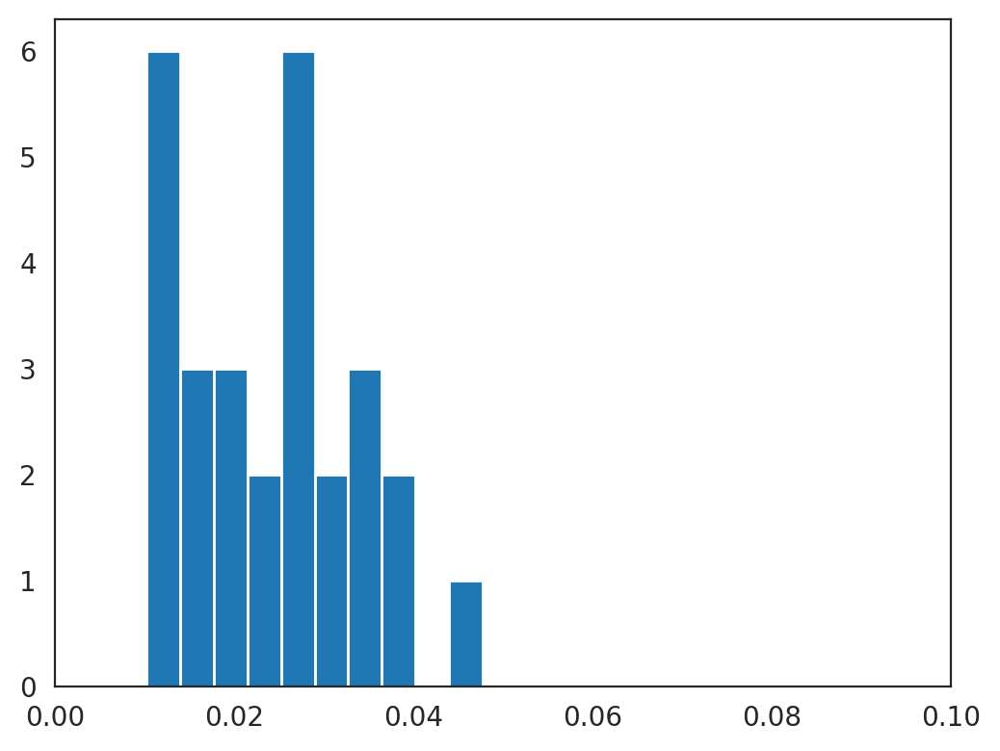

In [118]:
# check the distribution of coef_mean for each TF identified above
tf = "en1a"
coef_mean = filtered_links_df[filtered_links_df.source==tf].coef_mean
plt.hist(coef_mean, bins=10)
plt.xlim([0, 0.1])

ChatGPT suggestions:
- Network Visualization:
Consider visualizing the regulatory network using a network graph library like NetworkX. This can help you understand the overall structure and relationships between TFs.
- Correlation Analysis:
Perform correlation analysis to identify potential regulatory modules or clusters of highly correlated transcription factors.
- Top Regulatory Hubs:
Identify the top transcription factors with the highest in-degree and out-degree (or sum of both) in the network.
Functional Enrichment:

If you have additional information about the TFs (e.g., their biological functions or targets), consider performing functional enrichment analysis to gain insights into the roles of different TFs in the network.
Remember, exploratory analysis depends on the specific questions you want to answer and the goals of your study. Feel free to adapt and customize these recommendations based on your research objectives and data characteristics.

In [162]:
# all cell types
links.filtered_links.keys()

dict_keys(['Adaxial_Cells', 'Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites', 'unassigned'])

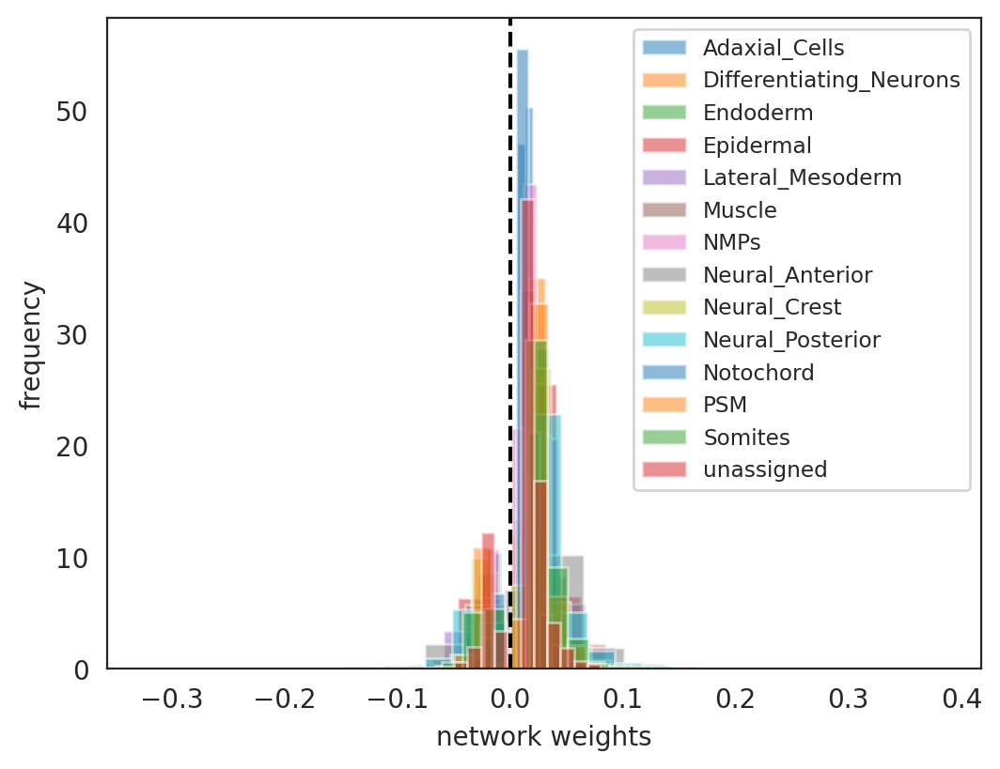

<Figure size 600x450 with 0 Axes>

In [121]:
celltypes = links.filtered_links.keys()

plt.figure()

for celltype in celltypes:
    filtered_links_df = links.filtered_links[celltype]
    plt.hist(filtered_links_df["coef_mean"], bins=20, density=True, alpha=0.5, label=celltype)
# Draw a vertical line along the y-axis at x=0
plt.axvline(x=0, color='black', linestyle='--')
plt.xlabel("network weights")
plt.ylabel("frequency")
plt.legend(fontsize="small")
plt.show()
plt.savefig("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/zebrahub-multiome-analysis/figures/network_plots_TDR118/coef_mean_allcelltypes_alledges.pdf")

You can confirm that there is no Cebpa connection in Ery_0 cluster.

In [86]:
# check all of the targets for one gene, "sox3", as an example
filtered_links_df[filtered_links_df.source == "sox3"]

,source,target,coef_mean,coef_abs,p,-logp
27799,sox3,cirbpa,0.109816,0.109816,1.673962e-11,10.776255
166096,sox3,si:ch73-281n10.2,0.068364,0.068364,3.746339e-05,4.426393
80389,sox3,hmgn2,0.049725,0.049725,7.330988e-15,14.134838
161827,sox3,serbp1a,0.047821,0.047821,4.091331e-12,11.388135
81372,sox3,hnrnpaba,0.042871,0.042871,5.391655e-13,12.268278
85201,sox3,hsp90ab1,0.037212,0.037212,3.727392e-15,14.428595
146434,sox3,ptmab,0.034544,0.034544,4.295737e-13,12.366962
204015,sox3,zbtb16a,0.033184,0.033184,8.822935e-09,8.054387
154624,sox3,rps20,0.030775,0.030775,5.454068e-16,15.263279
26163,sox3,cfl1,0.024636,0.024636,1.006169e-14,13.997329


# Step 3. visualization of GRN

- We will visualize the GRN using iGraph
- Other ideas or choices of packages should be illustrated below.

In [46]:
import igraph as ig
from igraph import Graph, plot
print(ig.__version__)

0.10.6


In [47]:
# Use the matplotlib as the backend for plotting (instead of Cairo)
ig.config['plotting.backend'] = 'matplotlib'

In [138]:
# layout = g.layout(layout='auto')
# coords_subgraph = layout[:2]  # Coordinates of the first two vertices
# ig.plot(g)
# #ig.plot(g, target='myfile.pdf')

## layout information - https://python.igraph.org/en/stable/visualisation.html
It is possible to perform linear transformations to the layout:

- Layout.translate()
- Layout.center()
- Layout.scale()
- Layout.fit_into()
- Layout.rotate()
- Layout.mirror()

as well as a generic nonlinear transformation via:

- Layout.transform()

The following regular layouts are supported:

- Graph.layout_star: star layout
- Graph.layout_circle: circular/spherical layout
- Graph.layout_grid: regular grid layout in 2D
- Graph.layout_grid_3d: regular grid layout in 3D
- Graph.layout_random: random layout (2D and 3D)

The following algorithms produce nice layouts for general graphs:

- Graph.layout_davidson_harel: Davidson-Harel layout, based on simulated annealing optimization including edge crossings
- Graph.layout_drl: DrL layout for large graphs (2D and 3D), a scalable force-directed layout
- Graph.layout_fruchterman_reingold: Fruchterman-Reingold layout (2D and 3D), a “spring-electric” layout based on classical physics
- Graph.layout_graphopt: the graphopt algorithm, another force-directed layout
- Graph.layout_kamada_kawai: Kamada-Kawai layout (2D and 3D), a “spring” layout based on classical physics
- Graph.layout_lgl: Large Graph Layout
- Graph.layout_mds: multidimensional scaling layout
- Graph.layout_umap: Uniform Manifold Approximation and Projection (2D and 3D). UMAP works especially well when the graph is composed by “clusters” that are loosely connected to each other.

The following algorithms are useful for trees (and for Sugiyama directed acyclic graphs or DAGs):

- Graph.layout_reingold_tilford: Reingold-Tilford layout
- Graph.layout_reingold_tilford_circular: circular Reingold-Tilford layout
- Graph.layout_sugiyama: Sugiyama layout, a hierarchical layout

For bipartite graphs, there is a dedicated function:

- Graph.layout_bipartite: bipartite layout
More might be added in the future, based on request.



<AxesSubplot:>

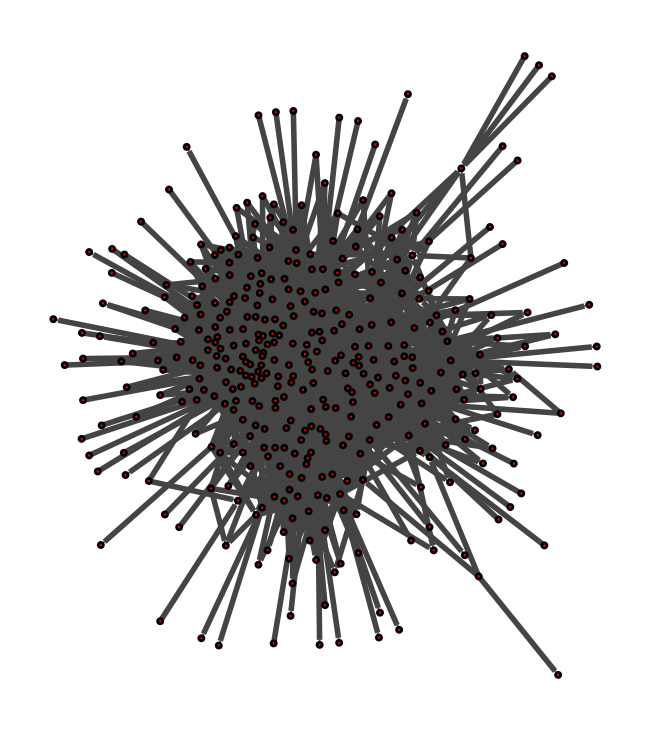

In [48]:
# Create a list of unique nodes (transcription factors)
nodes = pd.unique(filtered_links_df[['source', 'target']].values.ravel())

# Create an empty list to store the edges
edges = []

# Iterate through the data frame and add edges to the edges list
for _, row in filtered_links_df.iterrows():
    source = row['source']
    target = row['target']
    coef_mean = row['coef_mean']
    edges.append((source, target, coef_mean))

# Create an iGraph graph object
g = Graph.TupleList(edges, directed=True, weights=True)

# Plot the graph
fig, ax = plt.subplots()
ig.plot(g, target=ax)#, 
        #vertex_label=nodes, edge_label=g.es['weight'], layout='circle', vertex_color='lightblue')

In [49]:
# Create a list of unique nodes (transcription factors)
nodes = pd.unique(filtered_links_df[['source', 'target']].values.ravel())

# Create an iGraph graph object
g = ig.Graph(directed=True)

# Add the nodes to the graph
g.add_vertices(nodes)

# Add the edges with weights (coef_mean) to the graph
for _, row in filtered_links_df.iterrows():
    source = row['source']
    target = row['target']
    coef_mean = row['coef_mean']
    g.add_edge(source, target, weight=coef_mean)

# Set up visualization attributes
edge_width = [abs(weight) for weight in g.es['weight']]
edge_color = ['red' if weight > 0 else 'blue' for weight in g.es['weight']]

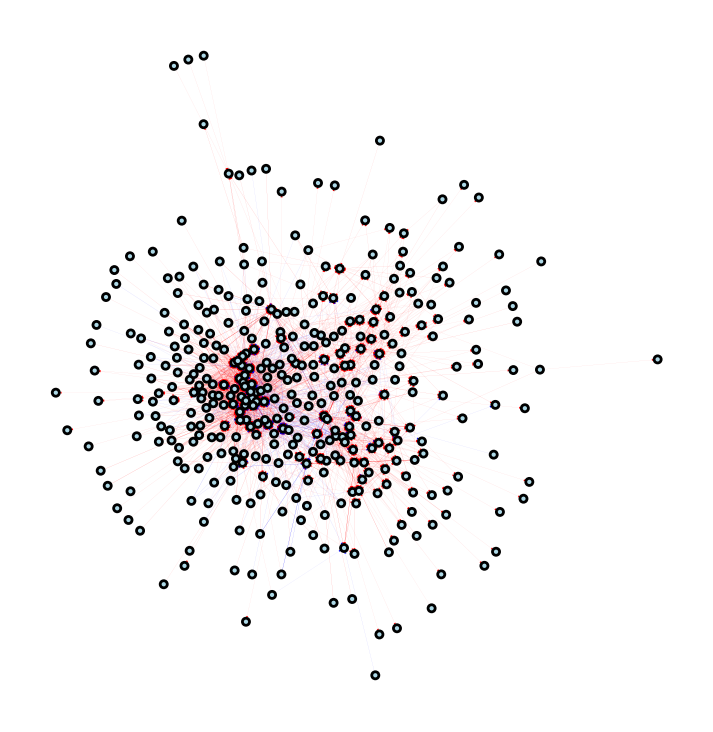

In [53]:
# # layout
# Layout.scale()

visual_style = {
    'vertex_size': 0.3,
    'vertex_color': 'lightblue',
    'edge_width': edge_width,
    'edge_color': edge_color,
    #'layout':layout,
    'bbox': (10, 10),  # Adjust the size of the figure here (width, height)
    'margin': 0.5,
}

# Plot the graph
plot(g, **visual_style)
plt.savefig("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/zebrahub-multiome-analysis/figures/network_plots_TDR118/igraph_network_NMP.pdf")

<AxesSubplot:>

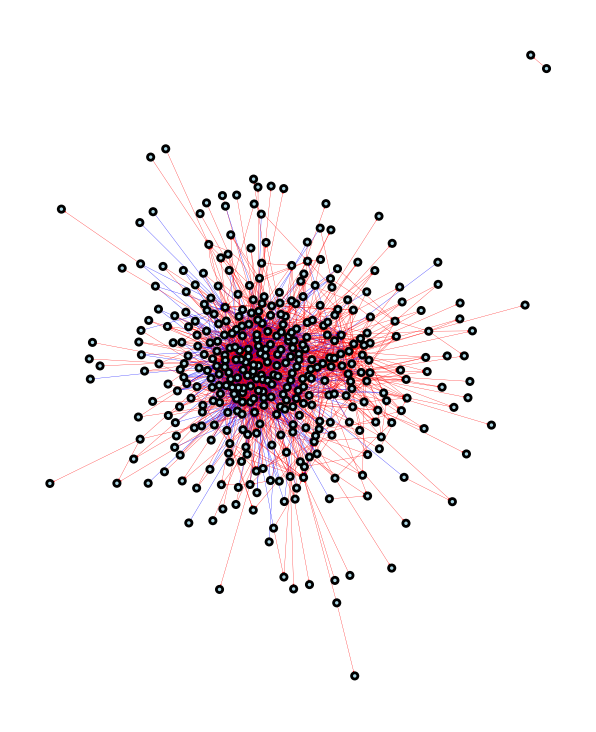

In [185]:
visual_style = {
    'vertex_size': 0.3,
    'vertex_color': 'lightblue',
    'edge_width': edge_width,
    'edge_color': edge_color,
    'edge_width':0.1,
    #'layout':layout,
    'bbox': (100, 100),  # Adjust the size of the figure here (width, height)
    'margin': 0.5,
}

# Plot the graph
plot(g, **visual_style)

# Step3. Degree distribution

Here, we will explore the inferred GRN (cell-type specific GRNs) using the examples from CellOracle notebooks as well as additional analyses.

- Degree distribution
- 

In [55]:
plt.rcParams["figure.figsize"] = [9, 4.5]

In [54]:
save_folder = "/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/zebrahub-multiome-analysis/figures/network_plots_TDR118"

Adaxial_Cells


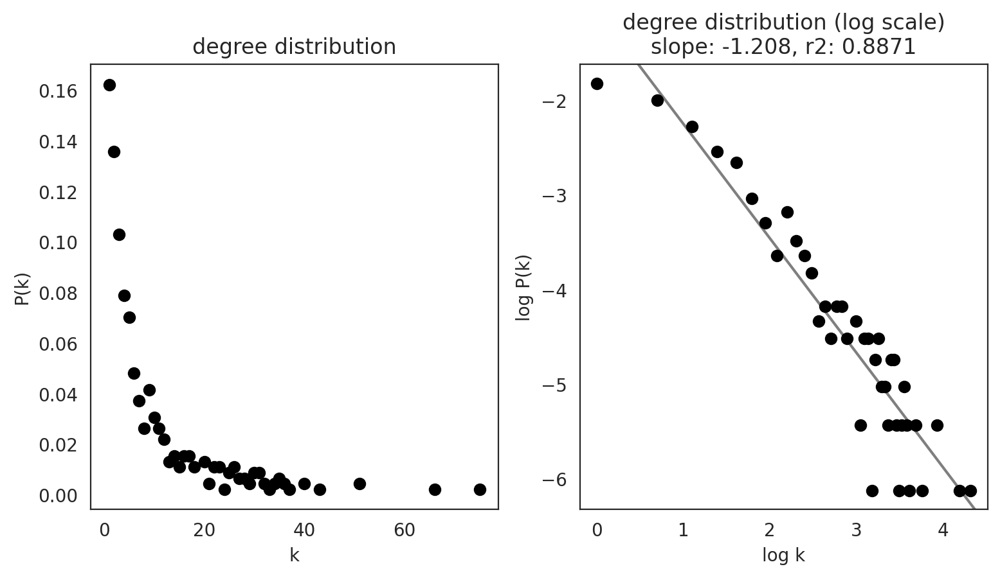

Differentiating_Neurons


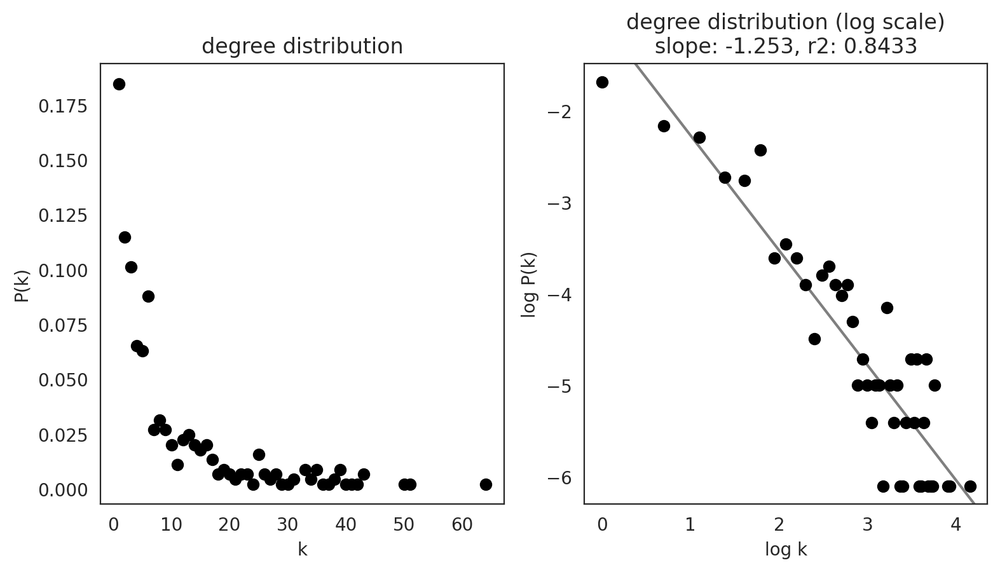

Endoderm


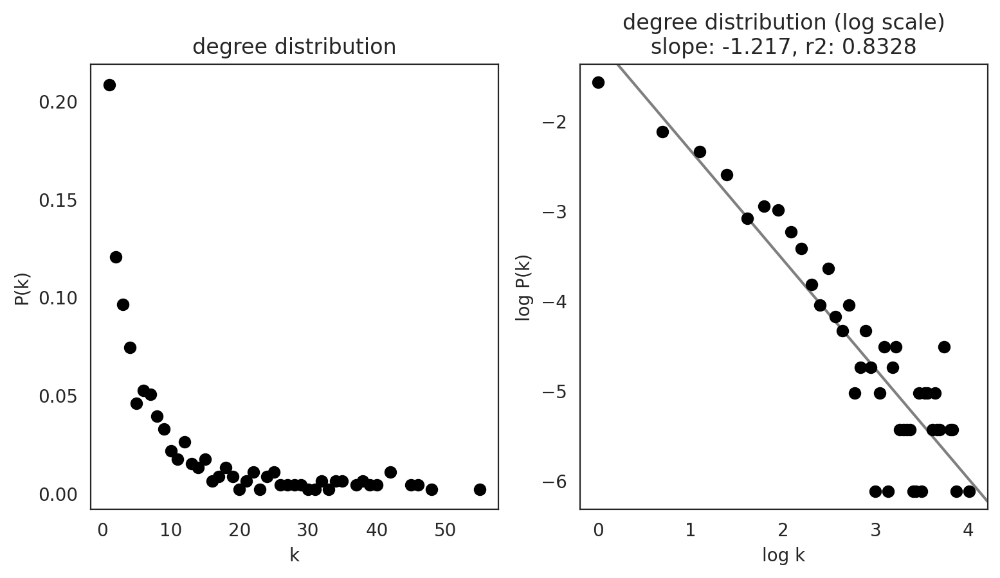

Epidermal


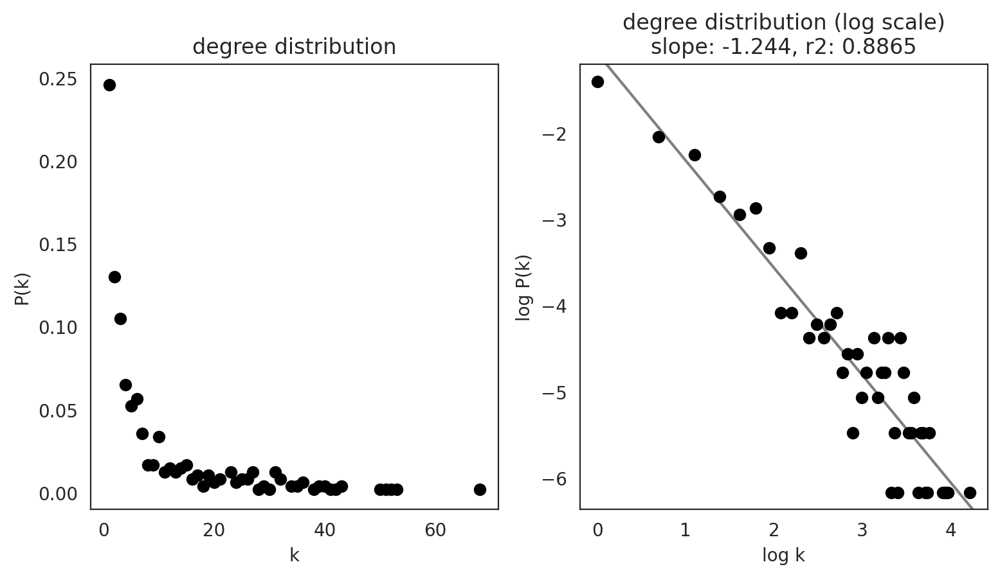

Lateral_Mesoderm


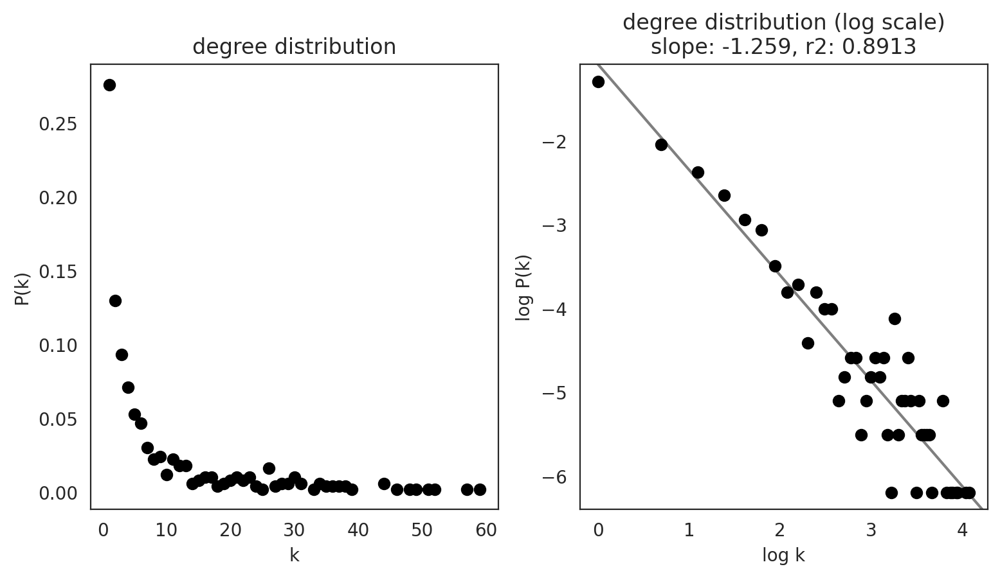

Muscle


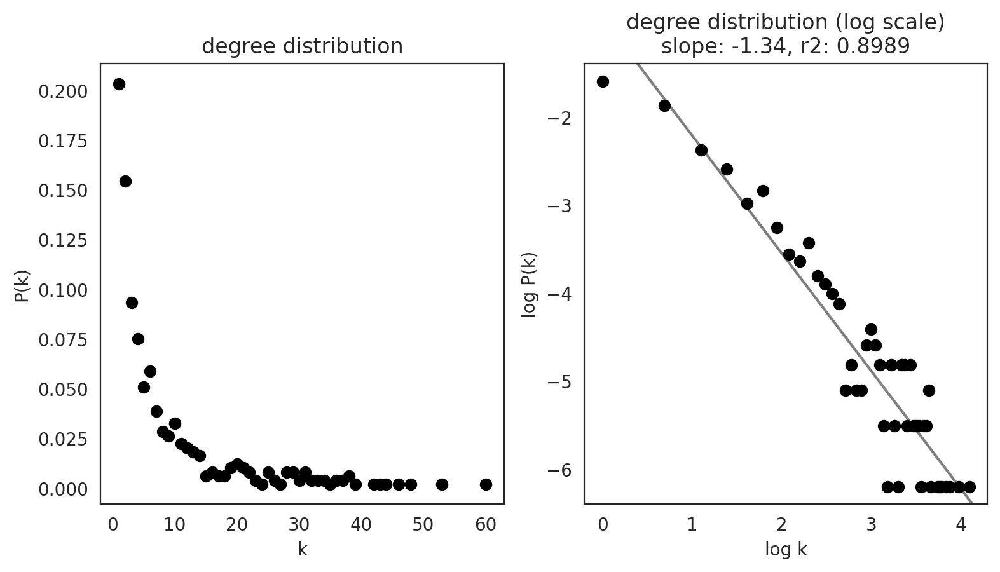

NMPs


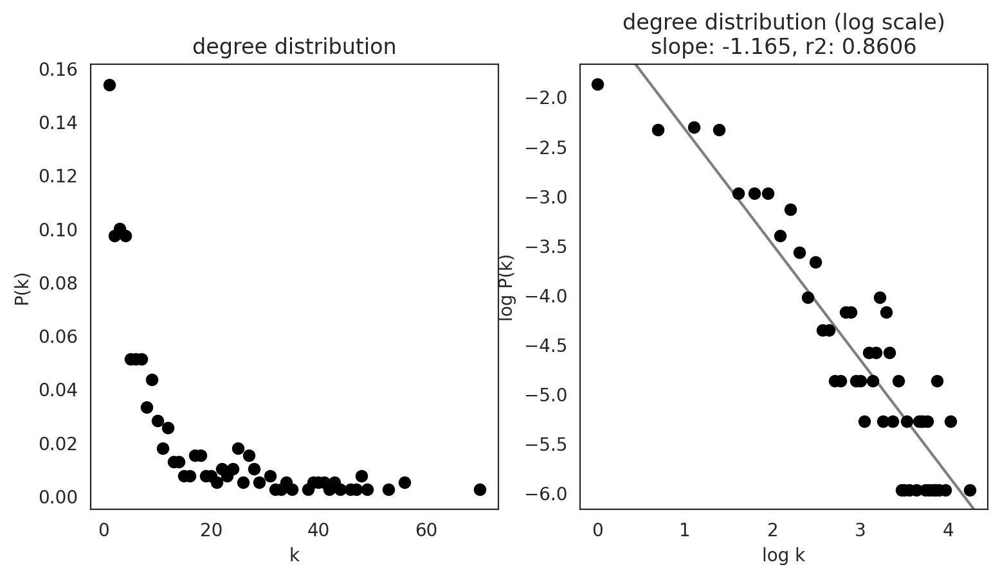

Neural_Anterior


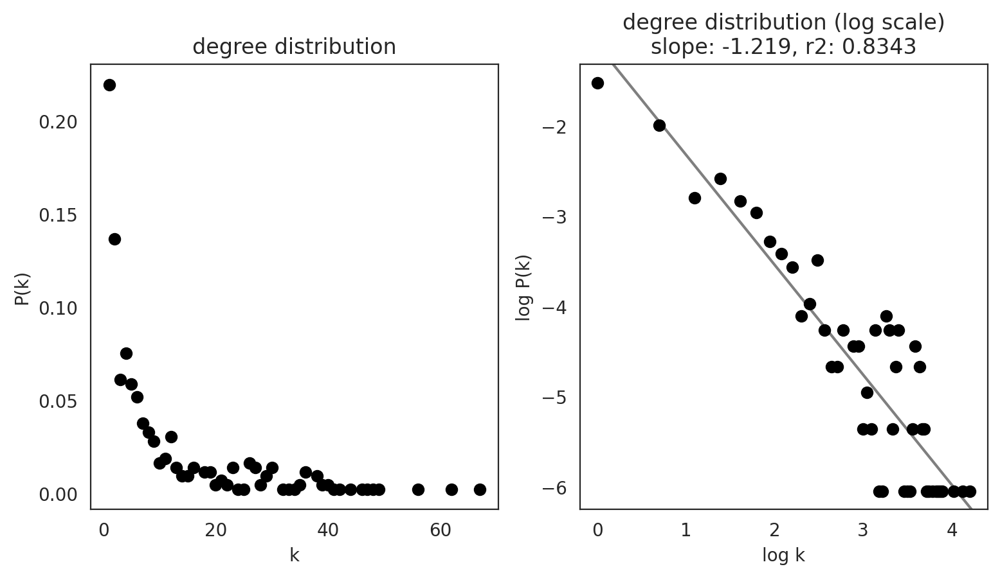

Neural_Crest


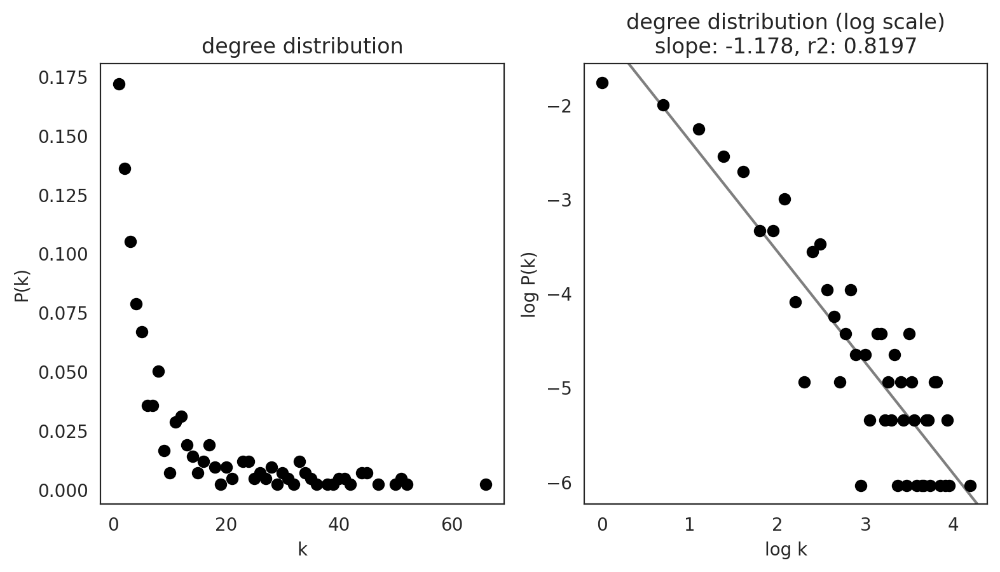

Neural_Posterior


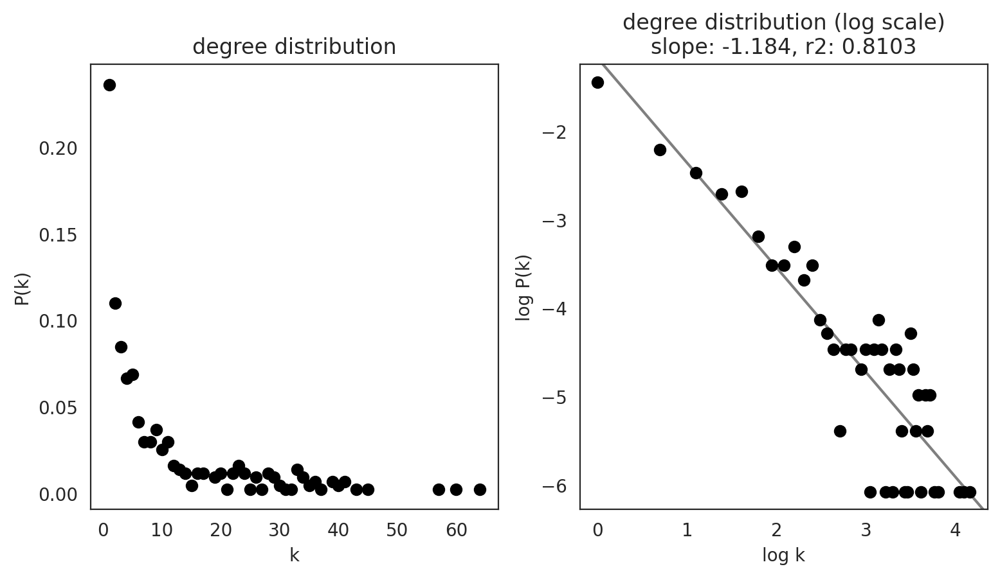

Notochord


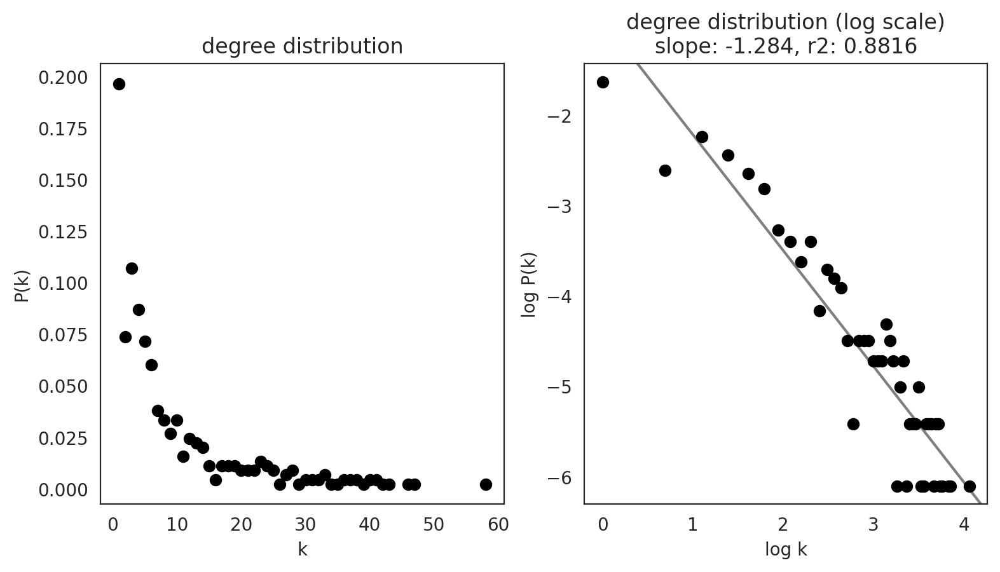

PSM


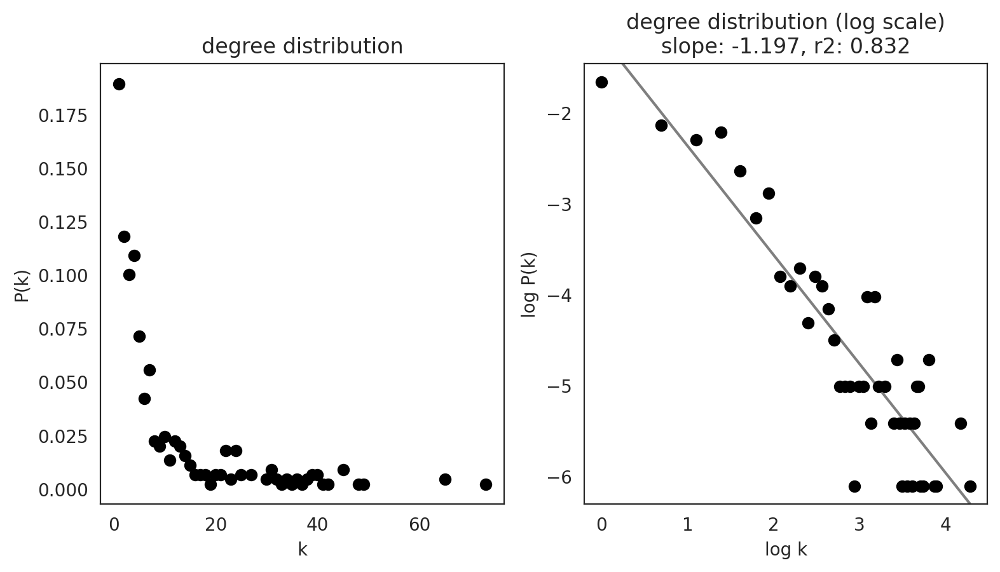

Somites


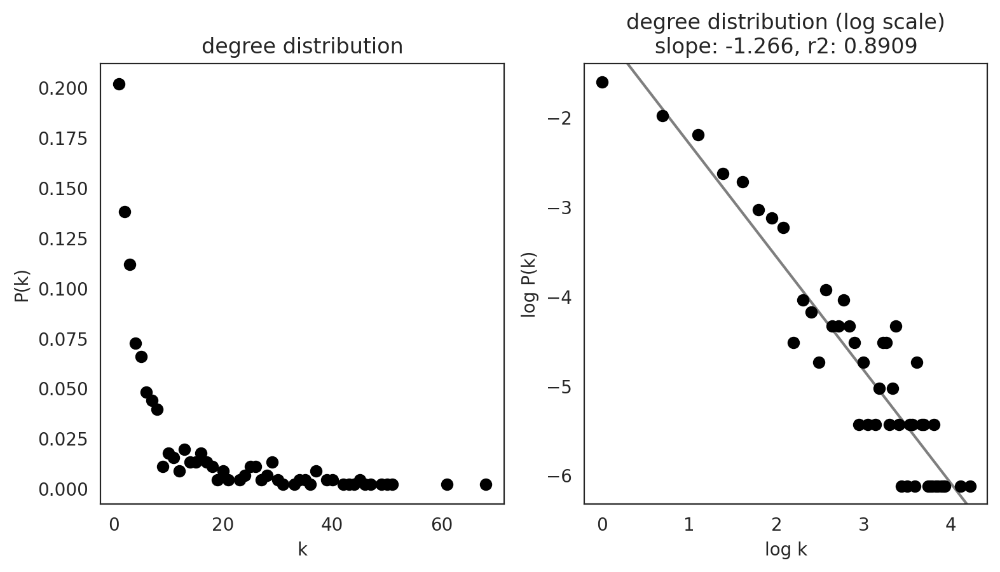

unassigned


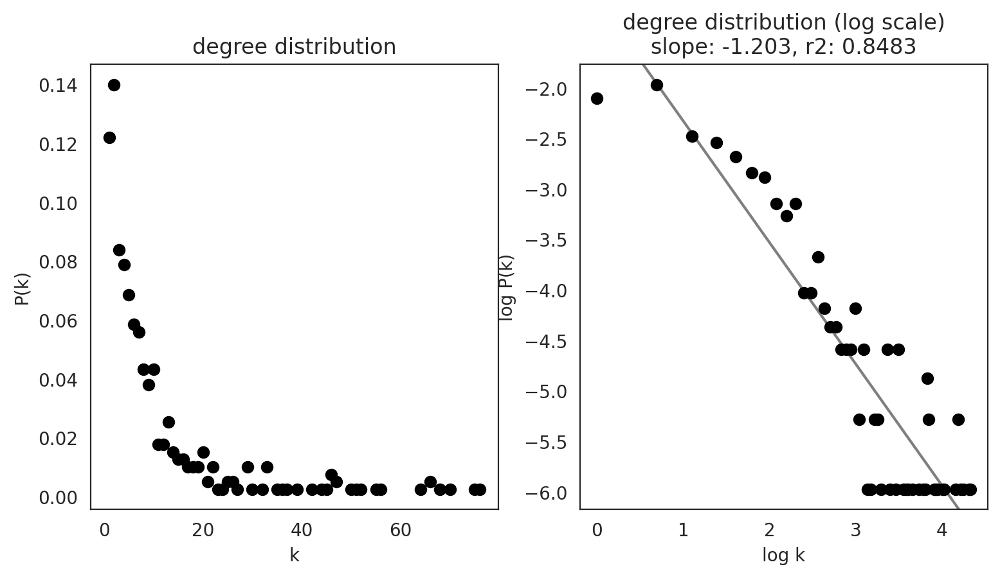

In [43]:
# Degree distribution
save_folder=figpath
links.plot_degree_distributions(plot_model=True, 
                                save=f"{save_folder}/degree_distribution/")

## Note

I need to learn how to interpret these degree distribution plots.
Power law?!

# Step 4. Network analysis; Network score for each gene
The Links class has many functions to visualize network score.
See the documentation for the details of the functions.

### Network score in each cluster


We have calculated several network scores using different centrality metrics.
We can use the centrality score to identify key regulatory genes because centrality is one of the important indicators of network structure (https://en.wikipedia.org/wiki/Centrality). 

Let's visualize genes with high network centrality.


In [56]:
# Check cluster name
links.cluster

['Adaxial_Cells',
 'Differentiating_Neurons',
 'Endoderm',
 'Epidermal',
 'Lateral_Mesoderm',
 'Muscle',
 'NMPs',
 'Neural_Anterior',
 'Neural_Crest',
 'Neural_Posterior',
 'Notochord',
 'PSM',
 'Somites',
 'unassigned']

In [57]:
# all network analysis values are saved in links.merged_score as a dataframe
links.merged_score.head()

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
hmga1a,44,0.096703,33,0.072527,11,0.024176,3136.0,0.737335,Adaxial_Cells
si:ch73-281n10.2,33,0.072527,33,0.072527,0,0.000000,0.0,0.690297,Adaxial_Cells
sp5l,14,0.030769,0,0.000000,14,0.030769,0.0,0.394797,Adaxial_Cells
cirbpa,35,0.076923,35,0.076923,0,0.000000,0.0,0.572439,Adaxial_Cells
fezf1,2,0.004396,0,0.000000,2,0.004396,0.0,0.024093,Adaxial_Cells


In [62]:
links.merged_score.value_counts(links.merged_score.index)

tbx5a      14
dag1       14
nr5a2      14
nr2f5      14
tubb2b     14
           ..
myl13       1
nbeaa       1
niban2a     1
nkain2      1
znfl2a      1
Name: count, Length: 739, dtype: int64

In [22]:
links.filtered_links["NMPs"]

,source,target,coef_mean,coef_abs,p,-logp
171664,nfatc1,slit3,0.167520,0.167520,6.099314e-13,12.214719
166079,hmga1a,si:ch73-281n10.2,0.134133,0.134133,8.328944e-17,16.079410
171665,creb5b,slit3,0.118250,0.118250,2.857576e-08,7.544002
27748,her9,cirbpa,0.109563,0.109563,5.209617e-10,9.283194
154387,mafbb,rpl7a,0.091194,0.091194,7.477311e-13,12.126255
...,...,...,...,...,...,...
871,foxi3a,actb1,0.010103,0.010103,1.992044e-07,6.700701
40775,sox3,dag1,0.010103,0.010103,2.348269e-09,8.629252
107705,sox21a,mdka,0.010102,0.010102,4.750005e-10,9.323306
26231,otpb,cfl1,0.010096,0.010096,3.951234e-05,4.403267


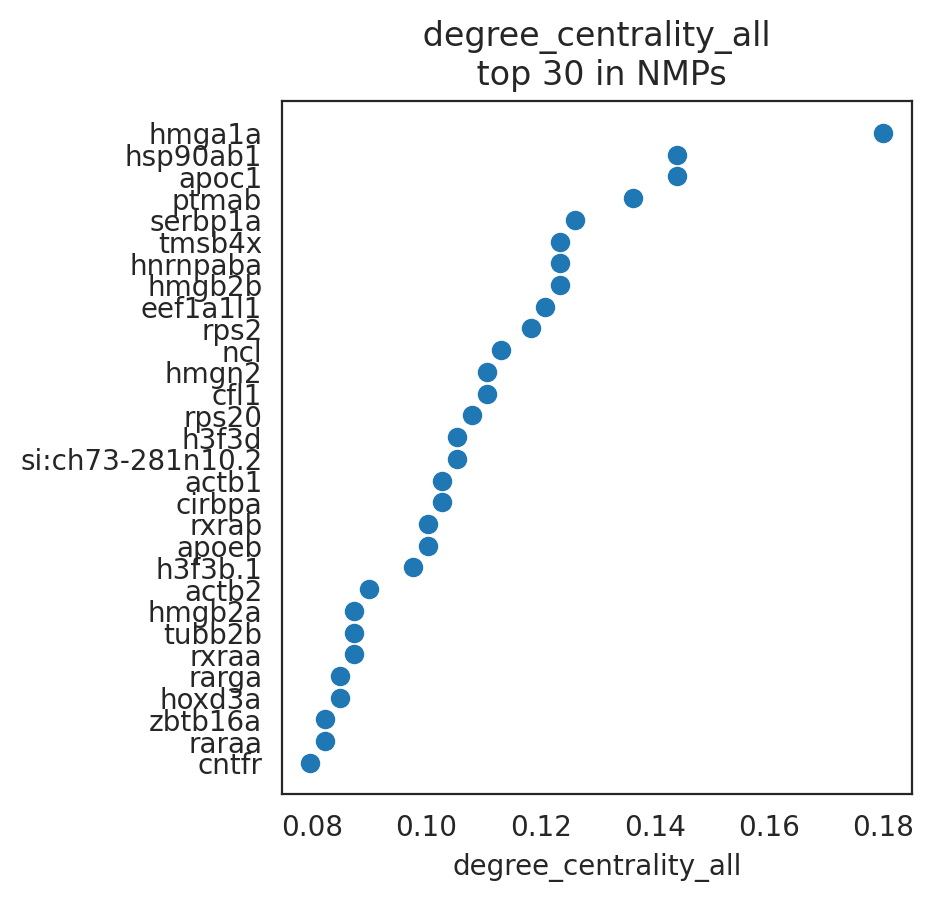

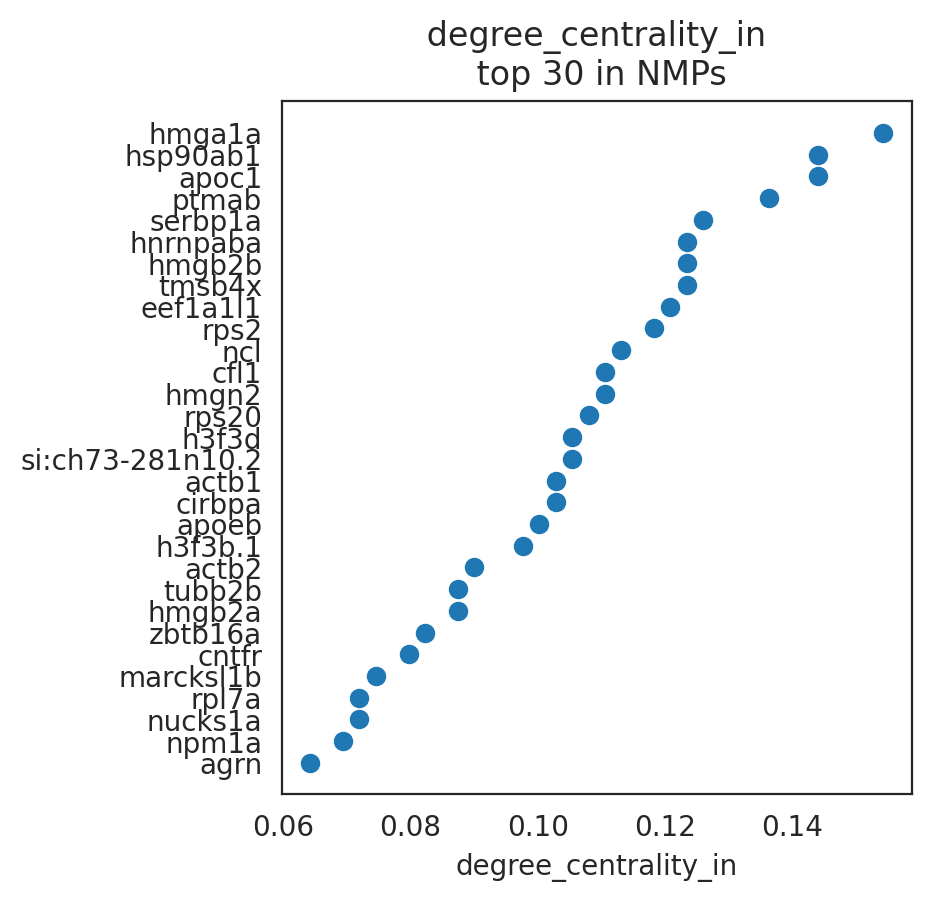

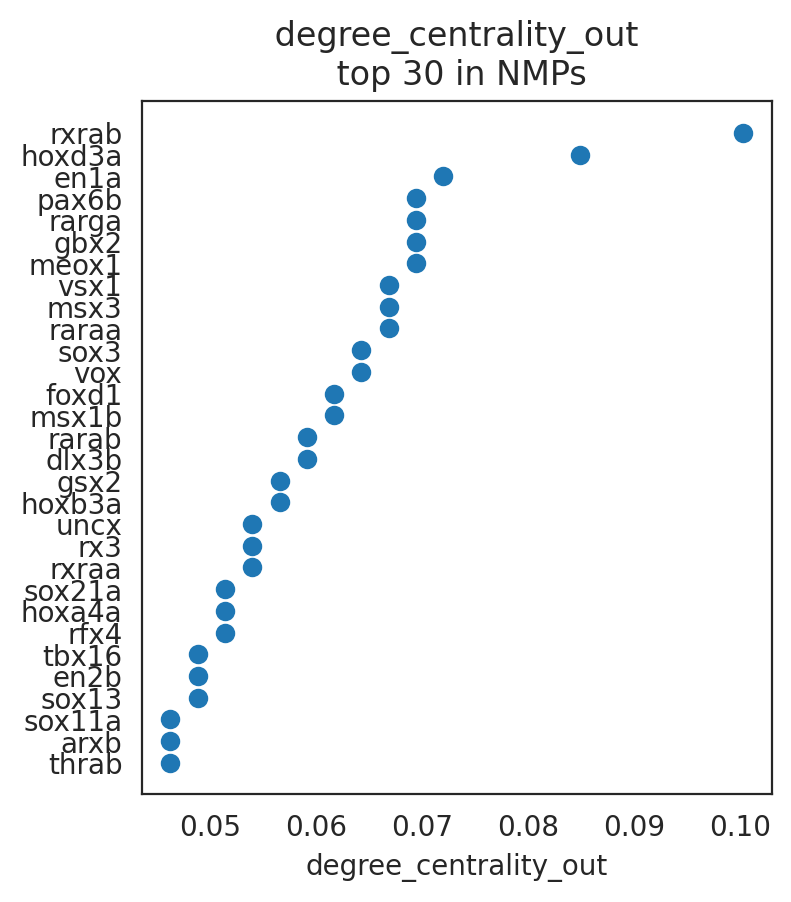

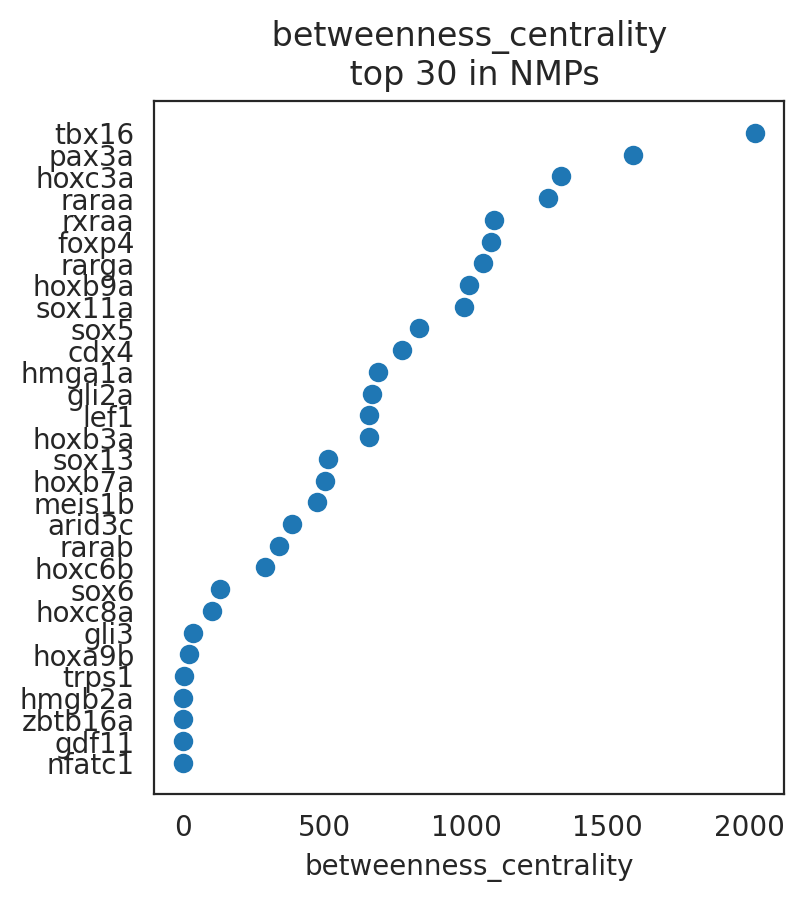

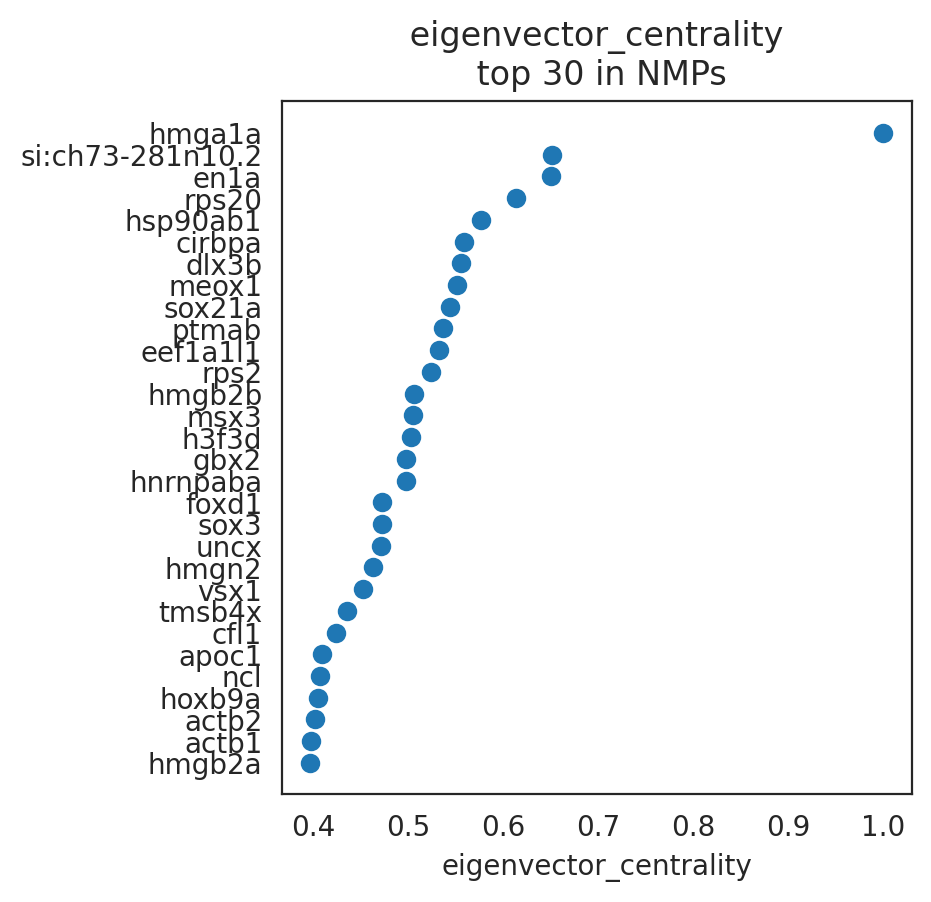

In [63]:
# Visualize top n-th genes that have high scores.
links.plot_scores_as_rank(cluster="NMPs", n_gene=30, 
                          save=save_folder+"/ranked_score")

In [64]:
links.cluster

['Adaxial_Cells',
 'Differentiating_Neurons',
 'Endoderm',
 'Epidermal',
 'Lateral_Mesoderm',
 'Muscle',
 'NMPs',
 'Neural_Anterior',
 'Neural_Crest',
 'Neural_Posterior',
 'Notochord',
 'PSM',
 'Somites',
 'unassigned']

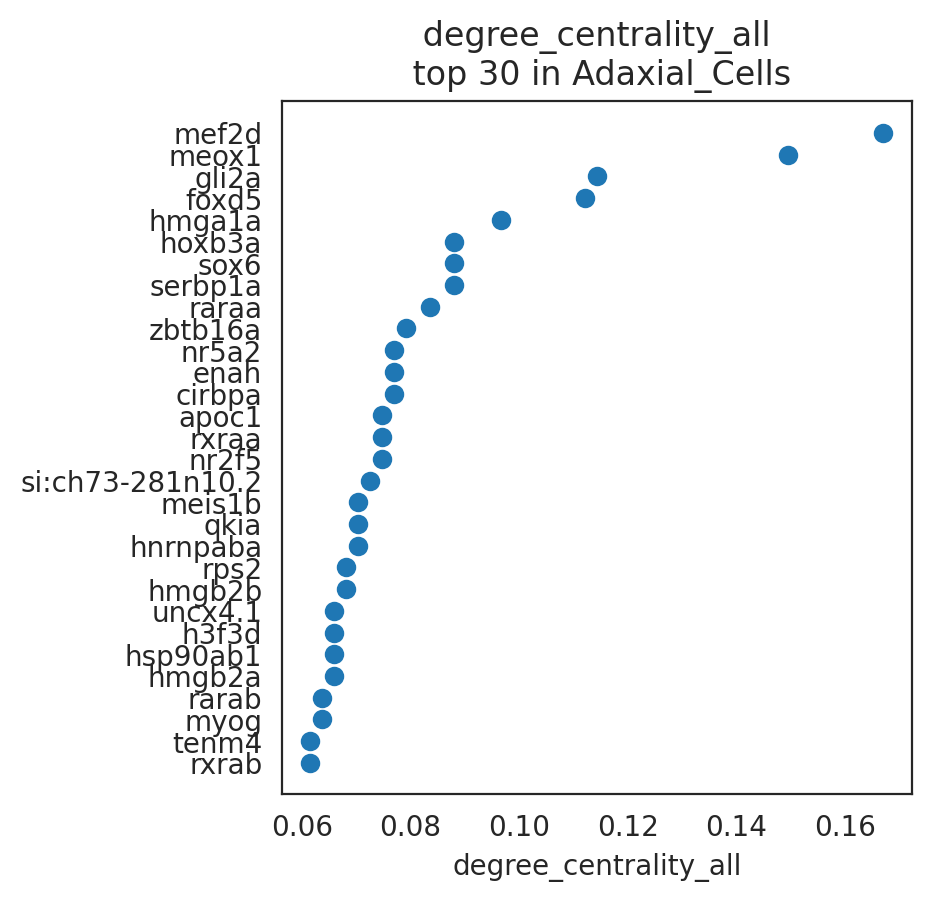

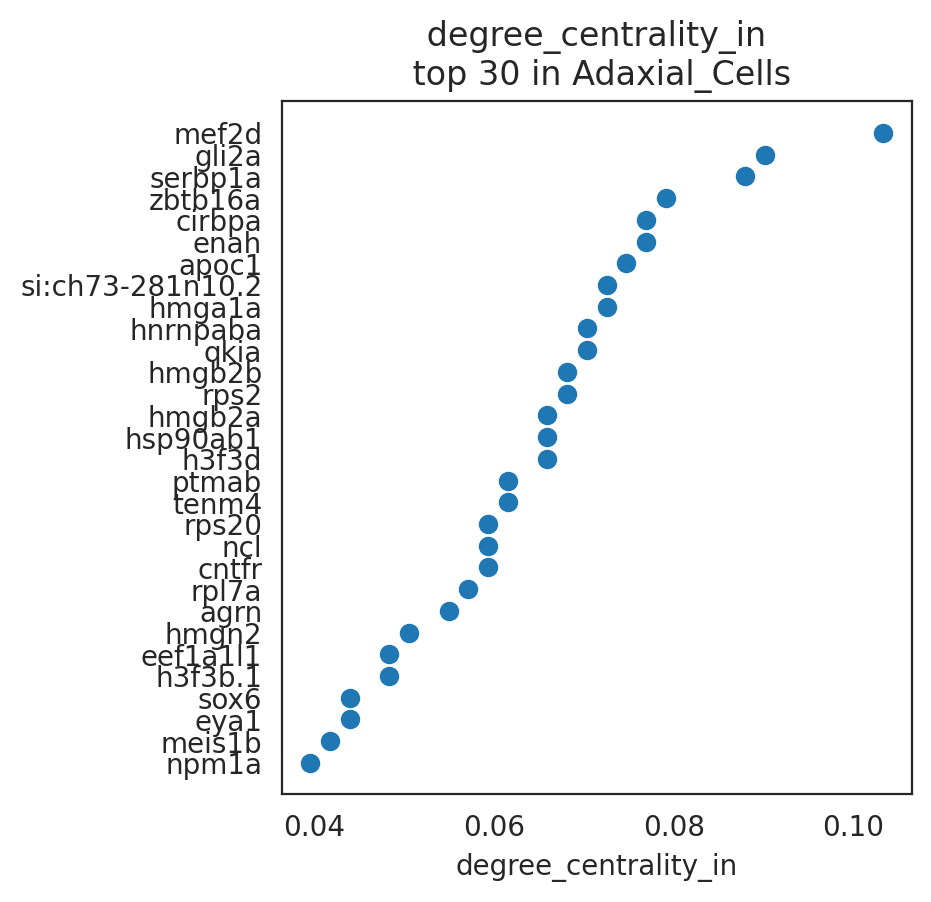

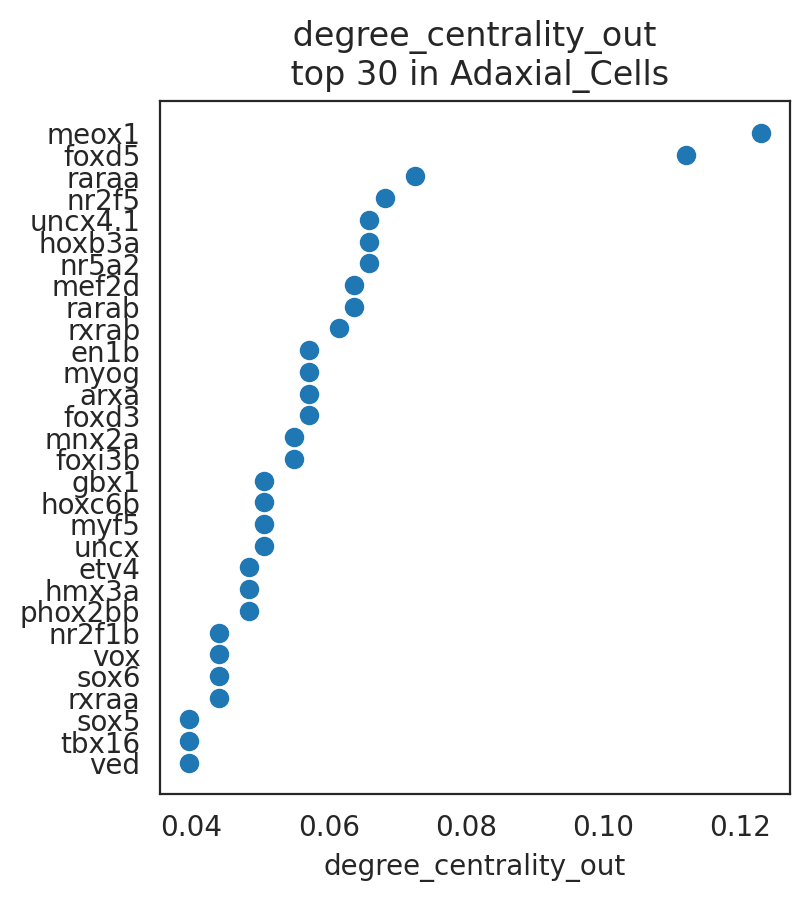

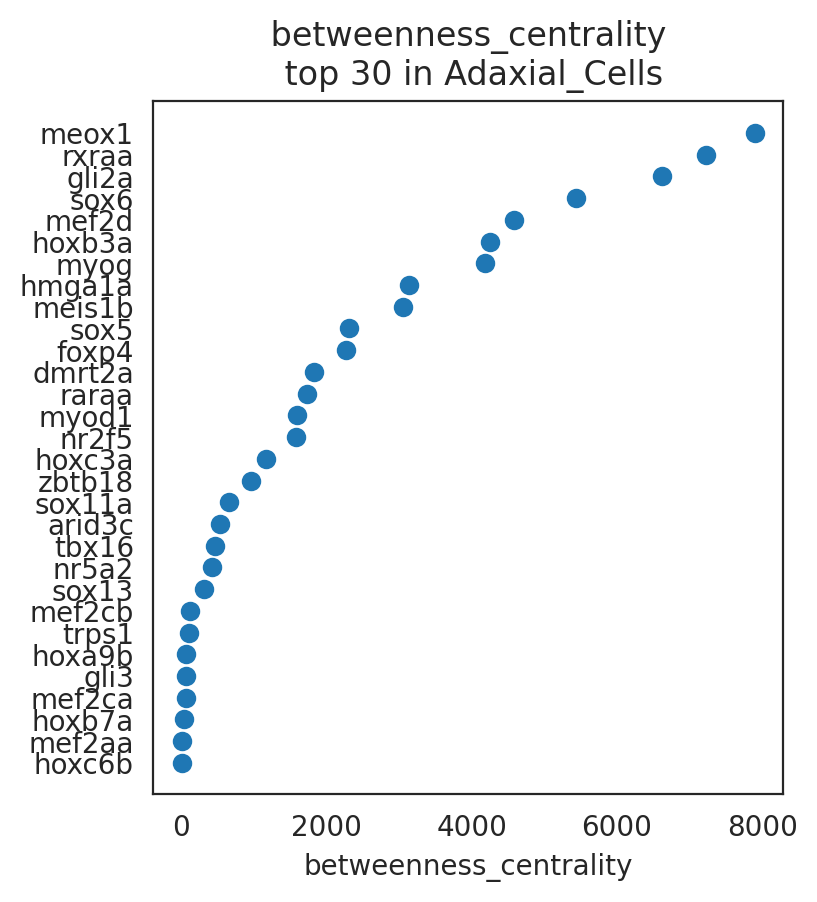

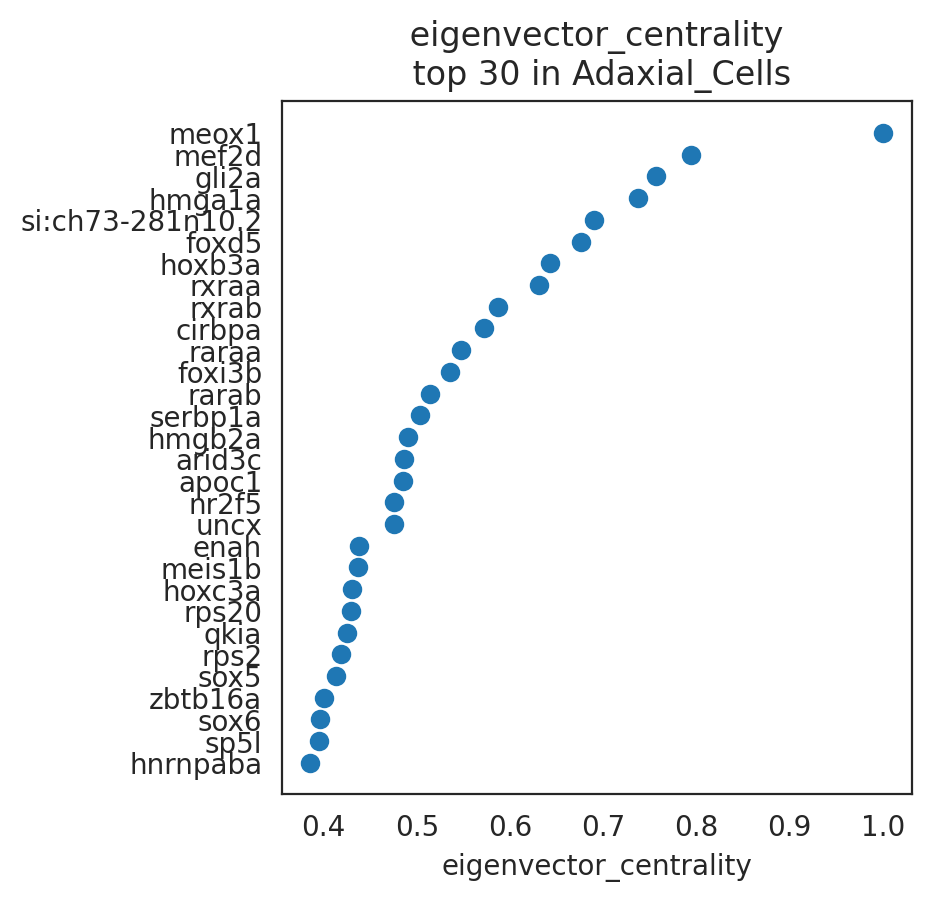

...

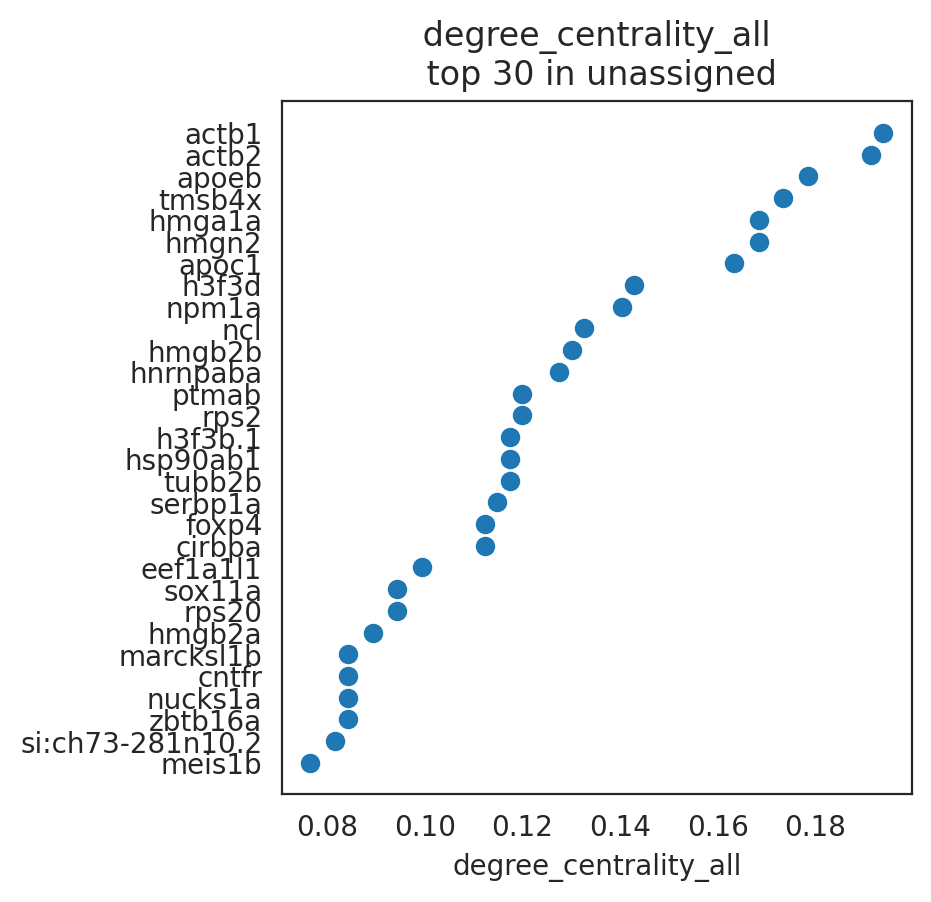

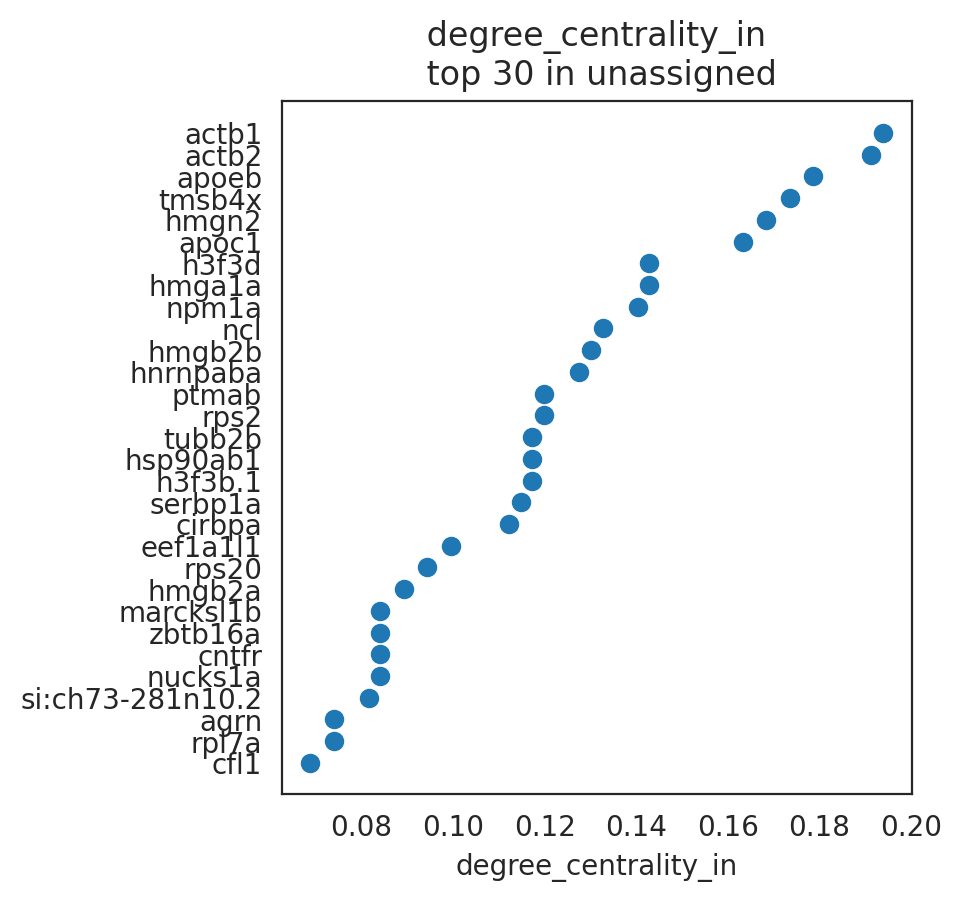

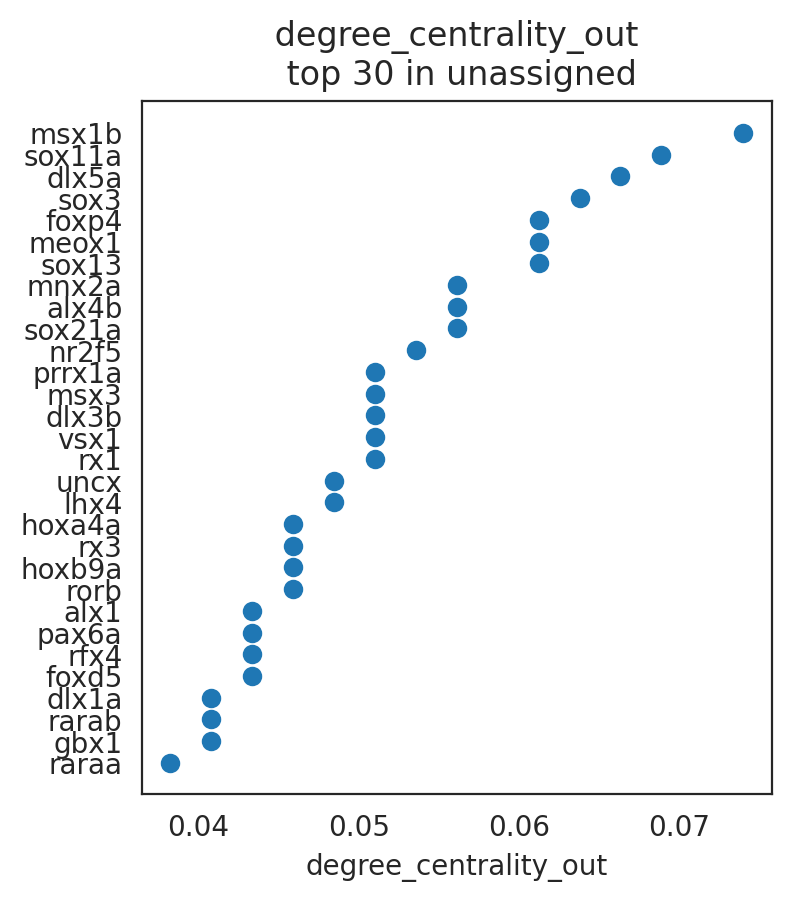

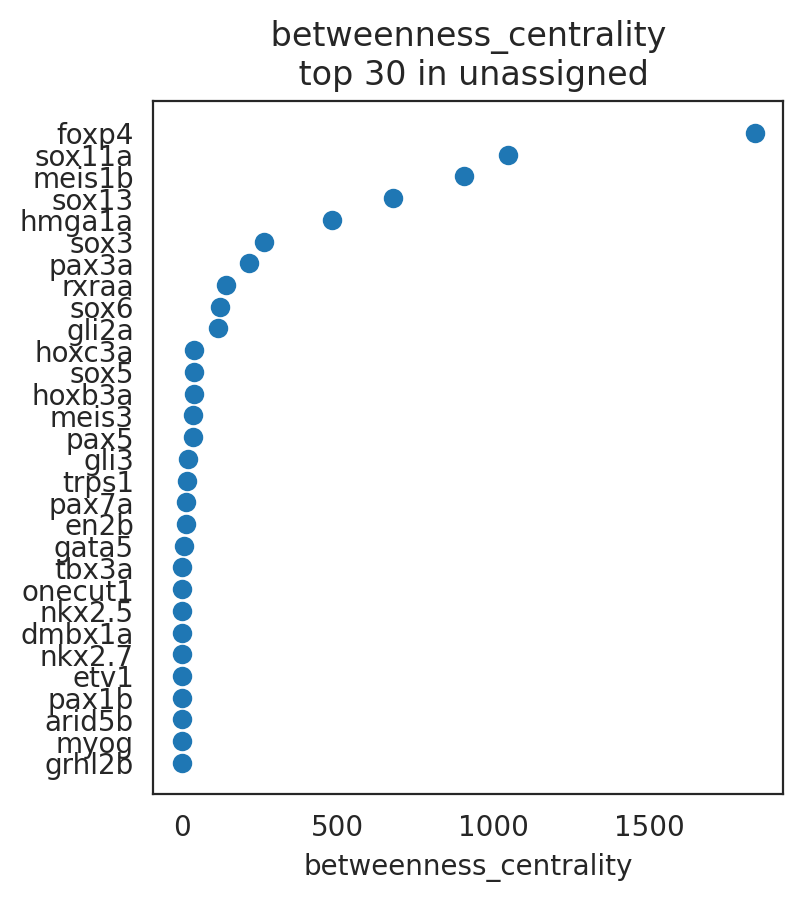

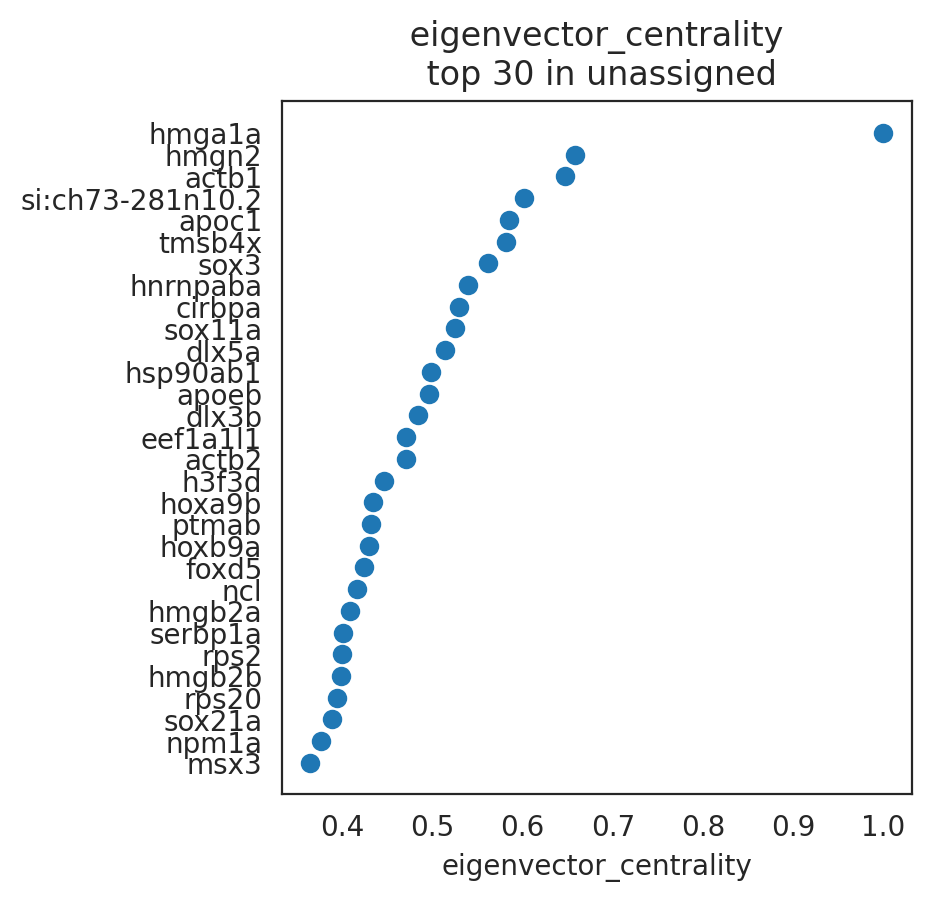

In [65]:
# Visualize top n-th genes that have high scores.
for celltype in links.cluster:
    links.plot_scores_as_rank(cluster=celltype, n_gene=30, 
                          save=save_folder+"/ranked_score")

### Network score comparison between two clusters (pair-wise)


By comparing network scores between two clusters, we can analyze differences in GRN structure.

In [68]:
plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

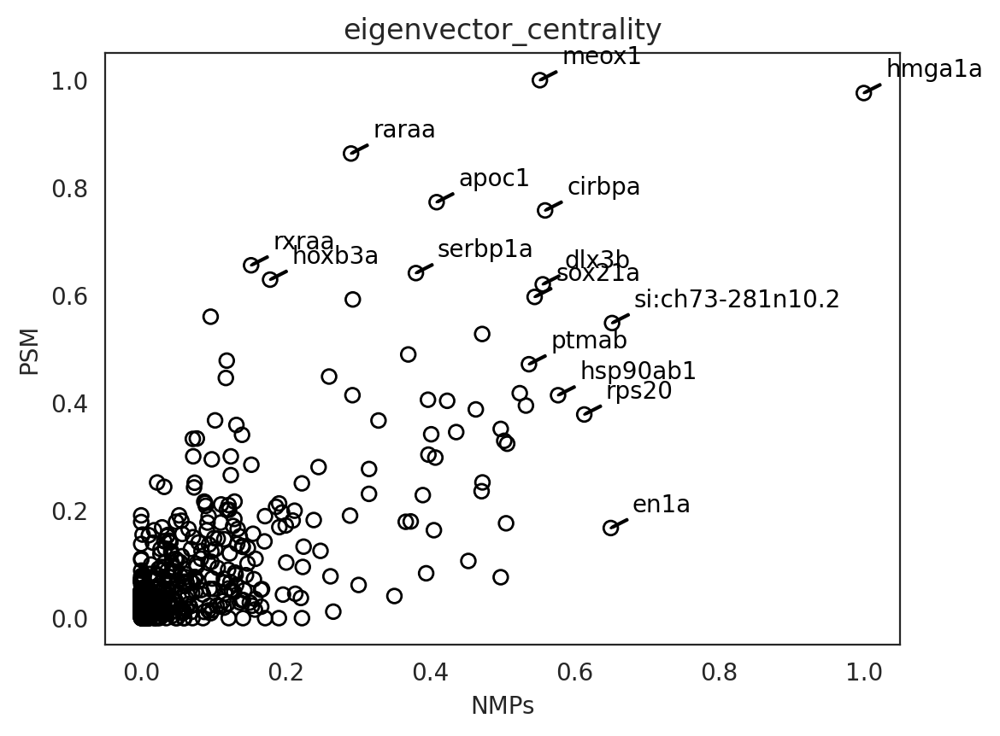

In [69]:
plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
links.plot_score_comparison_2D(value="eigenvector_centrality",
                               cluster1="NMPs", cluster2="PSM", 
                               percentile=98, save=save_folder+"/score_comparison")

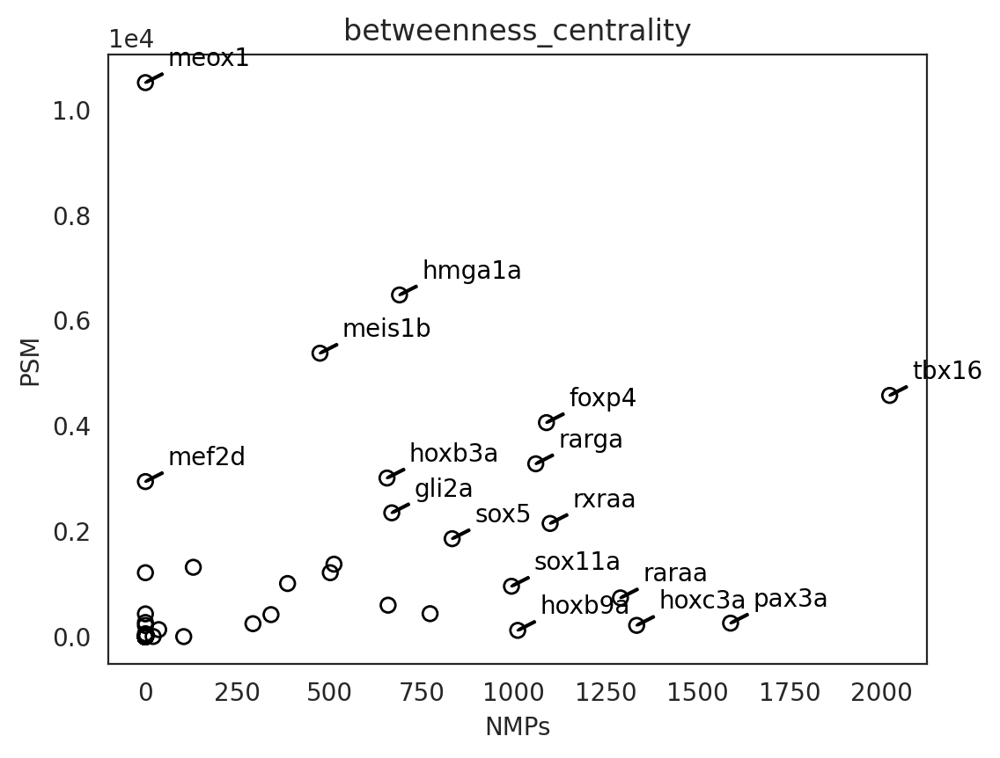

In [70]:
plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
links.plot_score_comparison_2D(value="betweenness_centrality",
                               cluster1="NMPs", cluster2="PSM", 
                               percentile=98, save=save_folder+"/score_comparison")

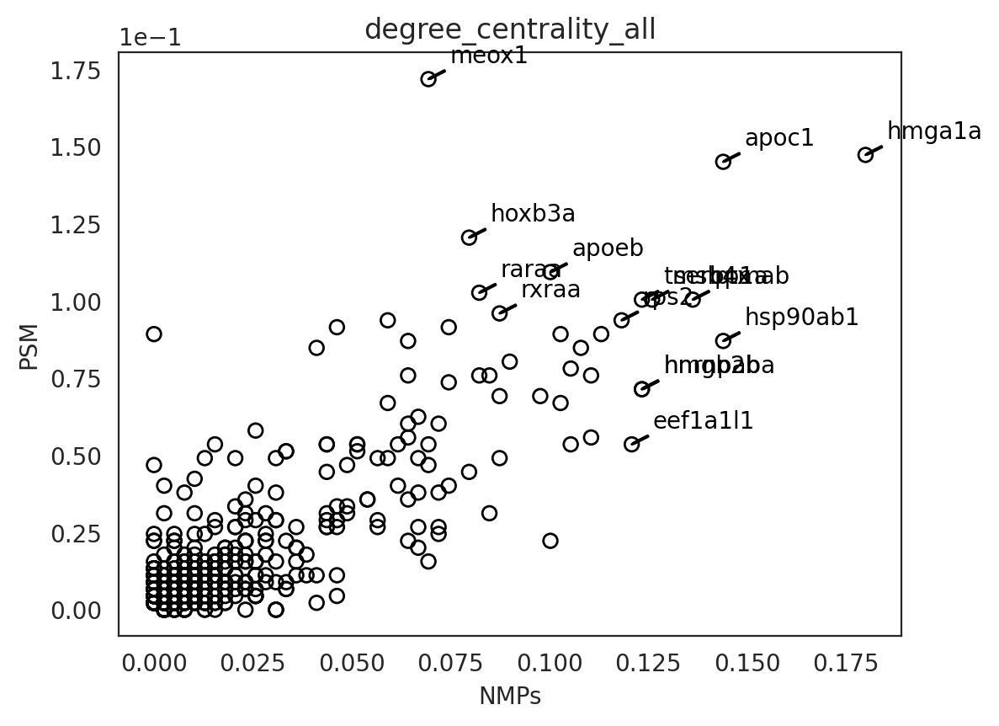

In [71]:
plt.ticklabel_format(style='sci',axis='y',scilimits=(0,0))
links.plot_score_comparison_2D(value="degree_centrality_all",
                               cluster1="NMPs", cluster2="PSM", 
                               percentile=98, save=save_folder+"/score_comparison")

### Network score dynamics
In the following session, we focus on how a gene's network score changes during the differentiation.

Using **gene_name**, we will demonstrate how you can visualize networks scores for a single gene.

NOTE: We don't have all the genes detected in scRNA-seq here, as our GRN underwent several filtering steps:
1) cicero filters for (a) highly co-accessible peaks, and (b) peaks associated with TSS.
2) aforementioned peaks were scanned for TF motifs (relying on an existing database of TF motifs, i.e. CisBP, JASPAR, etc.). Therefore, we have only ~800 TFs in the TF feature space. (missing sox2, tbxta, etc. Q. Are they TFs?)
3) genes(target)-by-TFs(regulatory) matrix is constructed as a base GRN (binarized).
4) scRNA-seq data is used to prune the base GRN with weights on the edges of the base GRN.
5) the pruned GRN is filtered based on the p-values (of linear regression), etc.


Here, as a proof-of-concept, we will check for the "noto' gene, which was shown to be important in notochord cell fate in CellOracle paper.

noto


/home/yang-joon.kim/.local/lib/python3.8/site-packages/celloracle/network_analysis/gene_analysis.py:320: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=res, y="cluster", x=value,
/home/yang-joon.kim/.local/lib/python3.8/site-packages/celloracle/network_analysis/gene_analysis.py:320: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=res, y="cluster", x=value,
/home/yang-joon.kim/.local/lib/python3.8/site-packages/celloracle/network_analysis/gene_analysis.py:320: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=res, y="cluster", x=value,


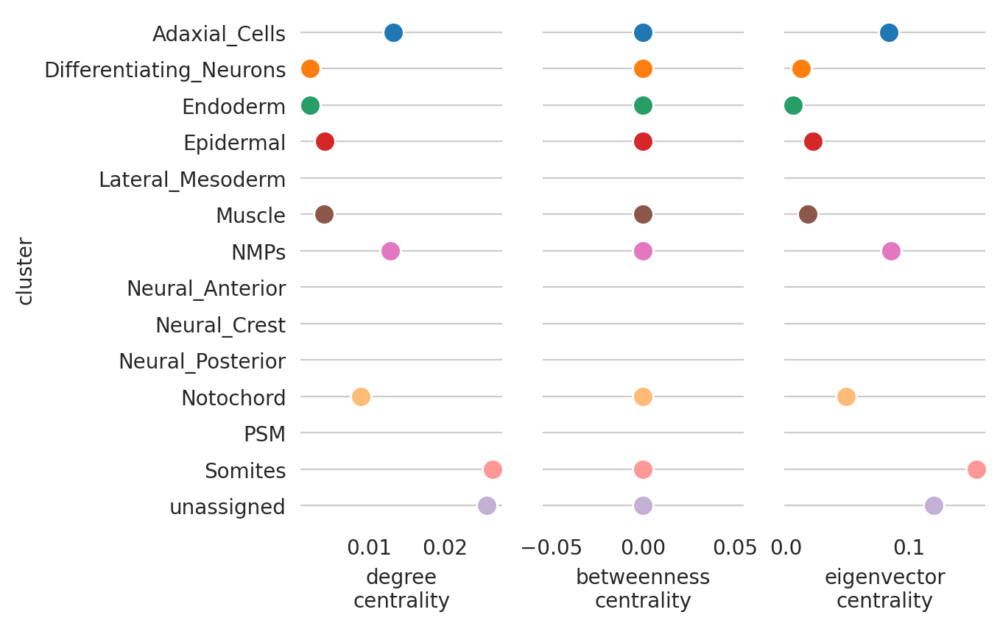

In [72]:
# Visualize Gata2 network score dynamics
links.plot_score_per_cluster(goi="noto")#, save="TDR118_15somite_GRN_coarse_celltypes/network_score_per_gene/")

If a gene have no connections in a cluster, it is impossible to calculate network degree scores.
Thus the scores will not be shown.
For example, Cebpa have no connection in the erythloids clusters, and there is no degree scores for Cebpa in these clusters as follows.

meox1


/home/yang-joon.kim/.local/lib/python3.8/site-packages/celloracle/network_analysis/gene_analysis.py:320: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=res, y="cluster", x=value,
/home/yang-joon.kim/.local/lib/python3.8/site-packages/celloracle/network_analysis/gene_analysis.py:320: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=res, y="cluster", x=value,
/home/yang-joon.kim/.local/lib/python3.8/site-packages/celloracle/network_analysis/gene_analysis.py:320: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  ax = sns.stripplot(data=res, y="cluster", x=value,


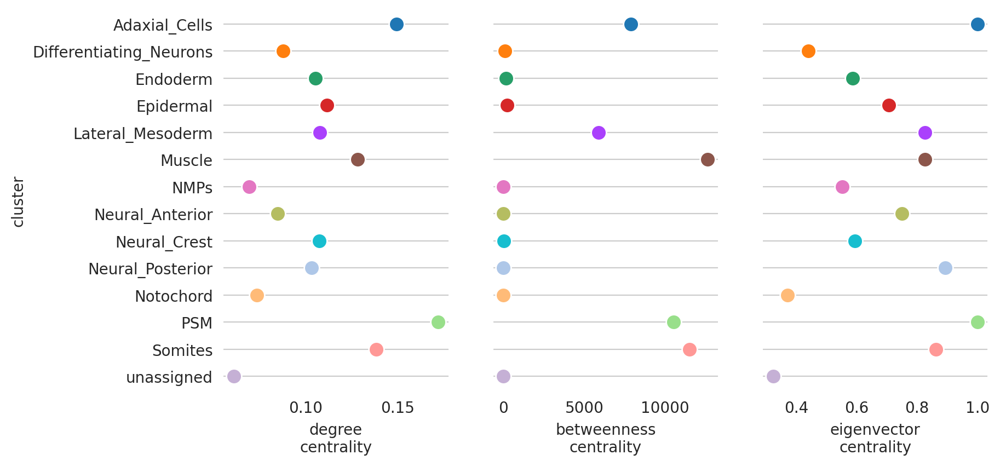

In [71]:
links.plot_score_per_cluster(goi="meox1")

## Step 4. Network visualization with network scores

- We will add the node labels for the genes identified from the above analyses (high network score, with different metrics).

- This will narrow down some intersting sub-networks that we can focus on.



In [63]:
# define the dataframe for the links.merged_score for all network properties
df_network = links.merged_score
df_network



cluster = "NMPs"
df_network_NMP = df_network[df_network["cluster"]==cluster]
df_network_NMP


,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
nfatc1,12,0.030848,0,0.000000,12,0.030848,0.0,0.118484,NMPs
slit3,14,0.035990,14,0.035990,0,0.000000,0.0,0.154737,NMPs
hmga1a,70,0.179949,60,0.154242,10,0.025707,690.0,1.000000,NMPs
si:ch73-281n10.2,41,0.105398,41,0.105398,0,0.000000,0.0,0.651643,NMPs
creb5b,3,0.007712,0,0.000000,3,0.007712,0.0,0.056825,NMPs
...,...,...,...,...,...,...,...,...,...
nkx2.4a,1,0.002571,0,0.000000,1,0.002571,0.0,0.011348,NMPs
hbbe3,1,0.002571,1,0.002571,0,0.000000,0.0,0.014660,NMPs
dla,1,0.002571,1,0.002571,0,0.000000,0.0,0.001639,NMPs
nkx2.2b,1,0.002571,0,0.000000,1,0.002571,0.0,0.009472,NMPs


In [64]:
df_network_NMP_sorted = df_network_NMP.sort_values("degree_all", ascending=False)
df_network_NMP_sorted

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
hmga1a,70,0.179949,60,0.154242,10,0.025707,690.0,1.000000,NMPs
hsp90ab1,56,0.143959,56,0.143959,0,0.000000,0.0,0.576886,NMPs
apoc1,56,0.143959,56,0.143959,0,0.000000,0.0,0.408850,NMPs
ptmab,53,0.136247,53,0.136247,0,0.000000,0.0,0.536595,NMPs
serbp1a,49,0.125964,49,0.125964,0,0.000000,0.0,0.380147,NMPs
...,...,...,...,...,...,...,...,...,...
tal1,1,0.002571,0,0.000000,1,0.002571,0.0,0.013628,NMPs
tbx15,1,0.002571,0,0.000000,1,0.002571,0.0,0.032293,NMPs
tfec,1,0.002571,0,0.000000,1,0.002571,0.0,0.002813,NMPs
alx4b,1,0.002571,0,0.000000,1,0.002571,0.0,0.010606,NMPs


In [70]:
df_network_NMP_sorted[0:30].index.to_list()

['hmga1a',
 'hsp90ab1',
 'apoc1',
 'ptmab',
 'serbp1a',
 'tmsb4x',
 'hnrnpaba',
 'hmgb2b',
 'eef1a1l1',
 'rps2',
 'ncl',
 'hmgn2',
 'cfl1',
 'rps20',
 'si:ch73-281n10.2',
 'h3f3d',
 'actb1',
 'cirbpa',
 'apoeb',
 'rxrab',
 'h3f3b.1',
 'actb2',
 'hmgb2a',
 'tubb2b',
 'rxraa',
 'rarga',
 'hoxd3a',
 'raraa',
 'zbtb16a',
 'hoxb3a']

In [ ]:
visual_style = {
    'vertex_size': 0.3,
    'vertex_color': 'lightblue',
    'edge_width': edge_width,
    'edge_color': edge_color,
    'edge_width':0.1,
    #'layout':layout,
    'bbox': (100, 100),  # Adjust the size of the figure here (width, height)
    'margin': 0.5,
}

# Plot the graph
plot(g, **visual_style)

# Step 5. Check the Network score's variability over cell types (or timepoints)

- We will check how the network score changes over cell types (along the known differentiation trajectories), but this framework can be used for "across timepoints" for a given cell type, once we have the full datasets across 6 timepoints.





In [72]:
df_network

cell_types = ["Neural_Anterior", "Neural_"]

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
hmga1a,44,0.096703,33,0.072527,11,0.024176,3136.0,0.737335,Adaxial_Cells
si:ch73-281n10.2,33,0.072527,33,0.072527,0,0.000000,0.0,0.690297,Adaxial_Cells
sp5l,14,0.030769,0,0.000000,14,0.030769,0.0,0.394797,Adaxial_Cells
cirbpa,35,0.076923,35,0.076923,0,0.000000,0.0,0.572439,Adaxial_Cells
fezf1,2,0.004396,0,0.000000,2,0.004396,0.0,0.024093,Adaxial_Cells
...,...,...,...,...,...,...,...,...,...
asph,2,0.005102,2,0.005102,0,0.000000,0.0,0.003067,unassigned
runx1t1,1,0.002551,1,0.002551,0,0.000000,0.0,0.002102,unassigned
ebf3a,1,0.002551,0,0.000000,1,0.002551,0.0,0.000000,unassigned
eya1,1,0.002551,1,0.002551,0,0.000000,0.0,0.000000,unassigned


In [73]:
df_network.cluster.unique()

array(['Adaxial_Cells', 'Differentiating_Neurons', 'Endoderm',
       'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs',
       'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord',
       'PSM', 'Somites', 'unassigned'], dtype=object)

In [74]:
oracle.adata

AnnData object with n_obs × n_vars = 13022 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ATAC', 'nFeature_ATAC', 'nucleosome_signal', 'nucleosome_percentile', 'TSS.enrichment', 'TSS.percentile', 'nCount_SCT', 'nFeature_SCT', 'predicted.id', 'SCT_snn_res.0.5', 'seurat_clusters', 'cell_annotation', 'nCount_peaks_celltype', 'nFeature_peaks_celltype', 'SCT.weight', 'peaks_celltype.weight', 'nCount_peaks_bulk', 'nFeature_peaks_bulk', 'degree_all', 'degree_centrality_all', 'degree_in', 'degree_centrality_in', 'degree_out', 'degree_centrality_out', 'betweenness_centrality', 'eigenvector_centrality', 'entropy', 'entropy_norm'
    var: 'features', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'symbol', 'isin_top1000_var_mean_genes', 'isin_TFdict_targets', 'isin_TFdict_regulators'
    uns: 'hvg', 'predicted.id_colors', 'log1p'
    obsm: 'X_atac.umap', 'X_atac.umap.cellranger', 'X_umap', 'X_umap.pca30', 'X_wnn.umap'
    layers: 'raw_count

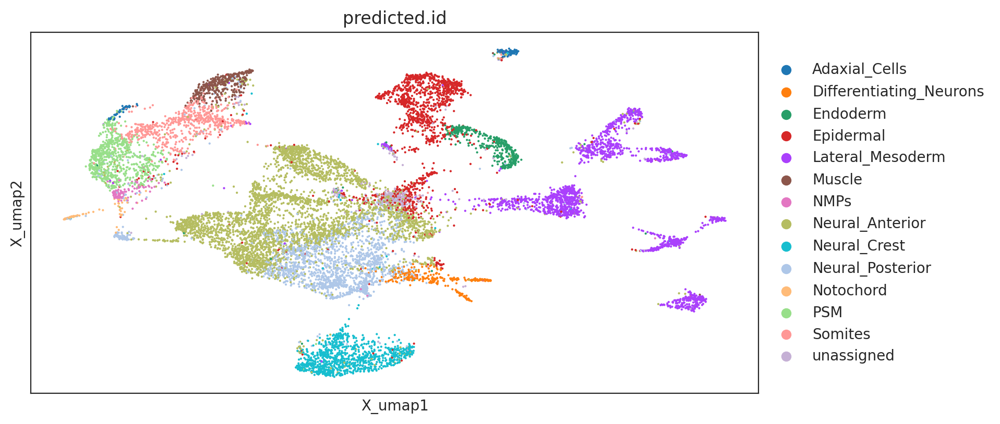

In [77]:
import scanpy as sc
sc.pl.embedding(oracle.adata, basis="X_umap", color="predicted.id")

## 7.4. Gene cartography analysis

Gene cartography is a method for gene network analysis.
The method classifies gene into several groups using the network module structure and connections.
It provides us an insight about the role and regulatory mechanism for each gene. 
For more information on gene cartography, please refer to the following paper (https://www.nature.com/articles/nature03288).

The gene cartography will be calculated for the GRN in each cluster.
Thus we can know how the gene cartography change by comparing the the score between clusters.

/home/yang-joon.kim/.local/lib/python3.8/site-packages/celloracle/network_analysis/links_object.py:394: DeprecationWarning: This is the deprecated function. This function will be removed in the future version.
  warnings.warn(


Adaxial_Cells


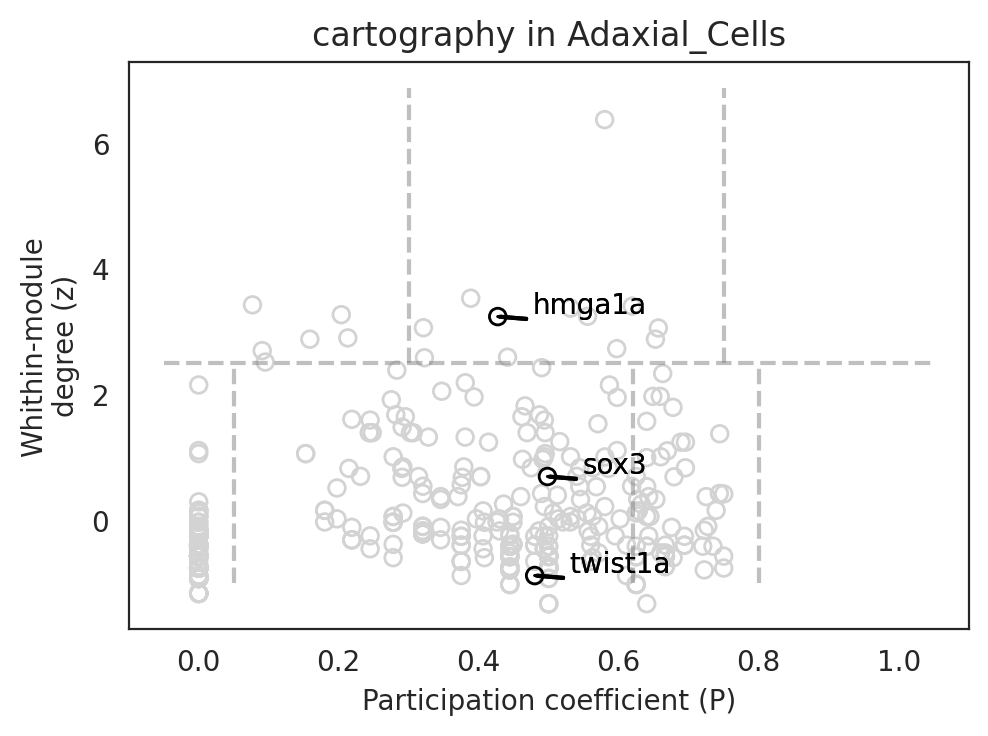

Differentiating_Neurons


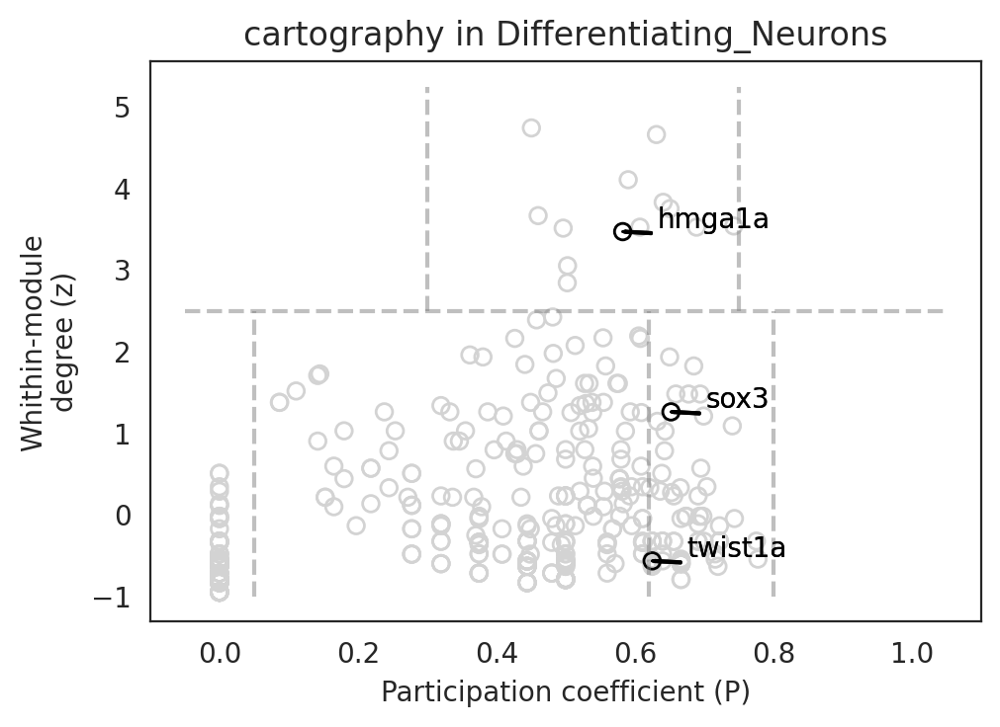

Endoderm


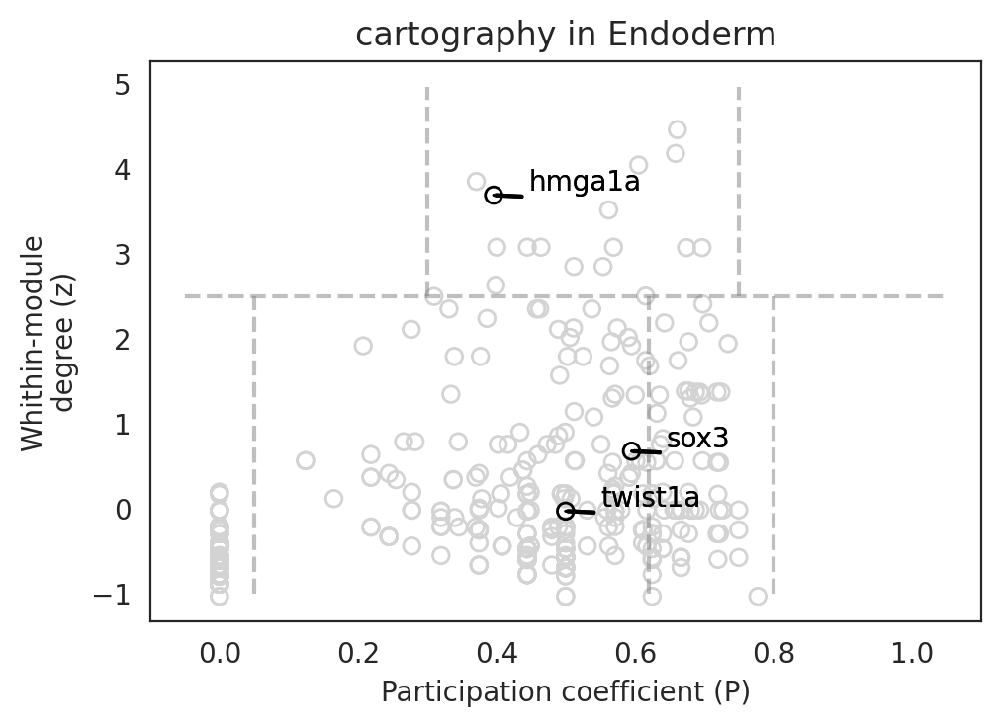

Epidermal


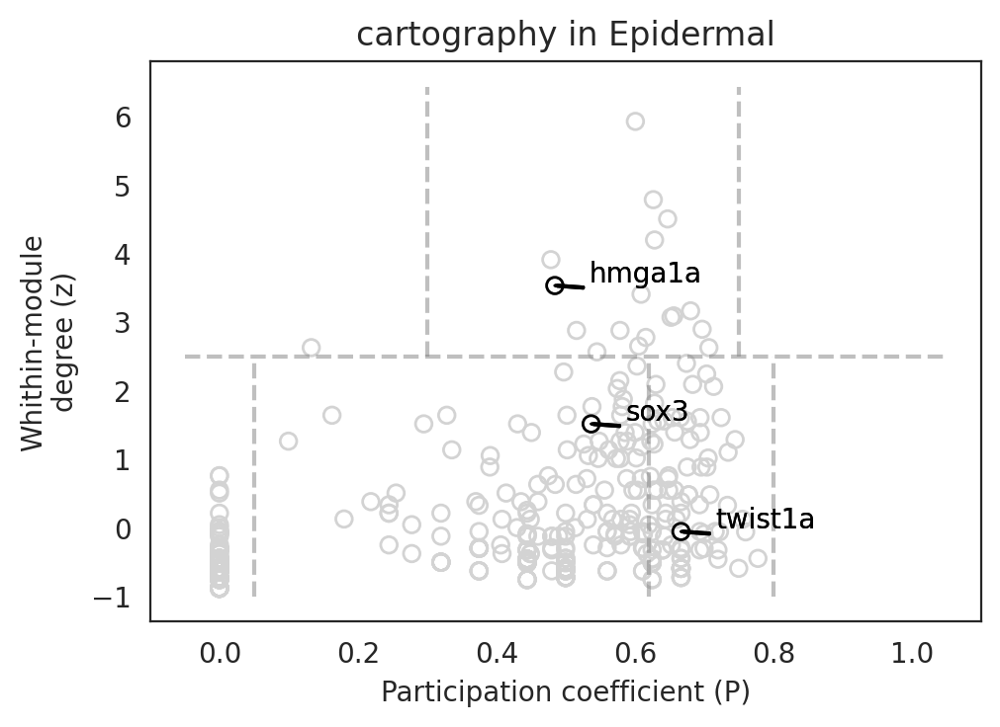

Lateral_Mesoderm


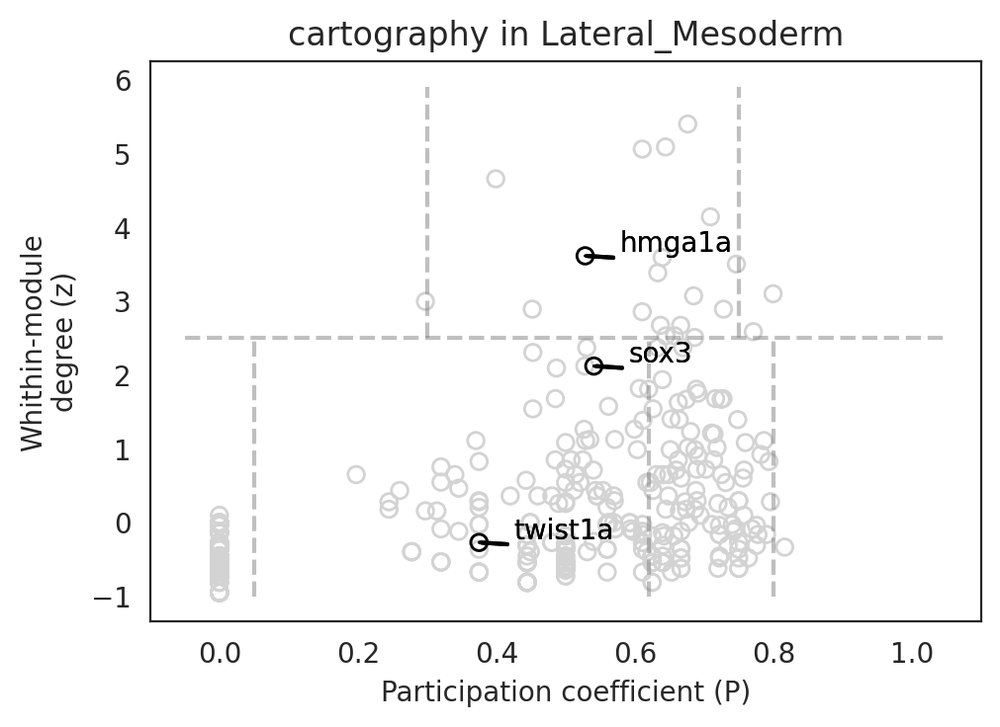

Muscle


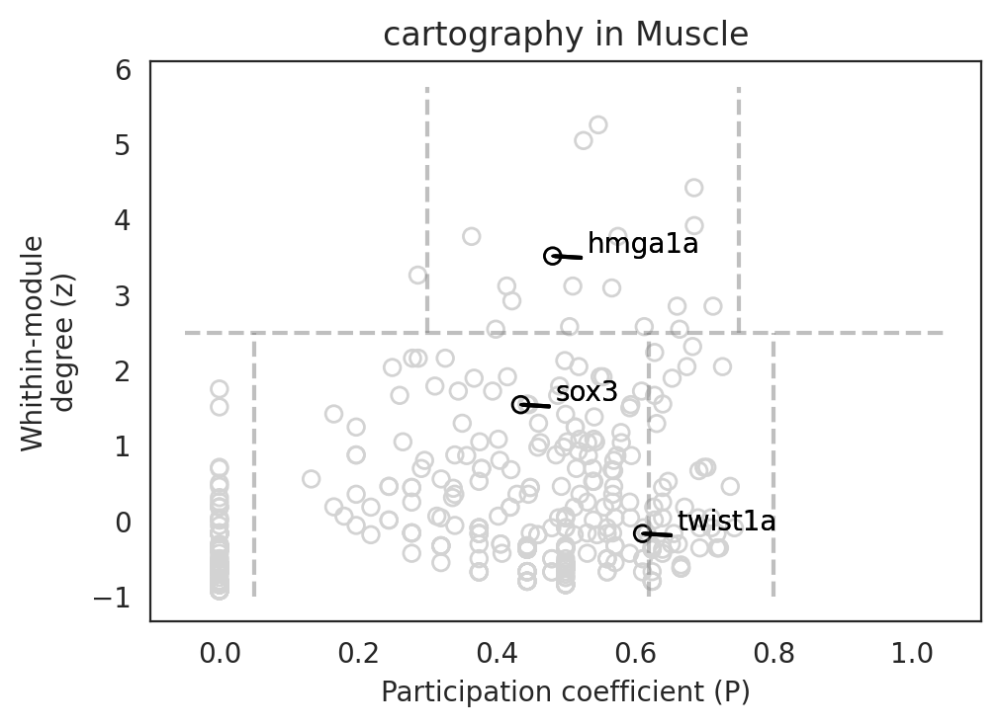

NMPs


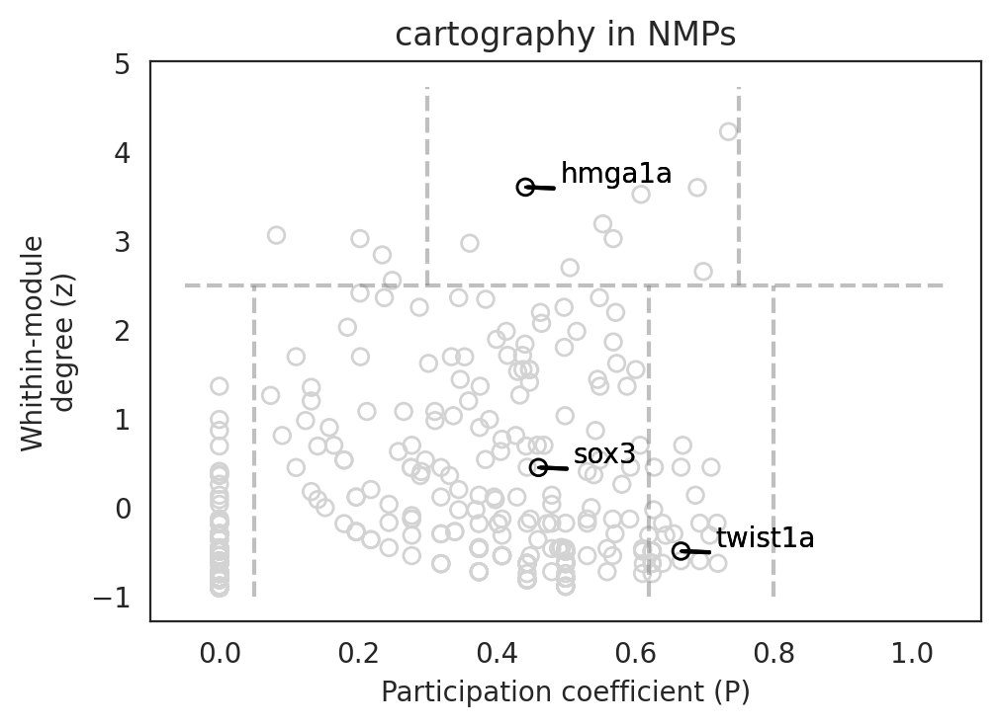

Neural_Anterior


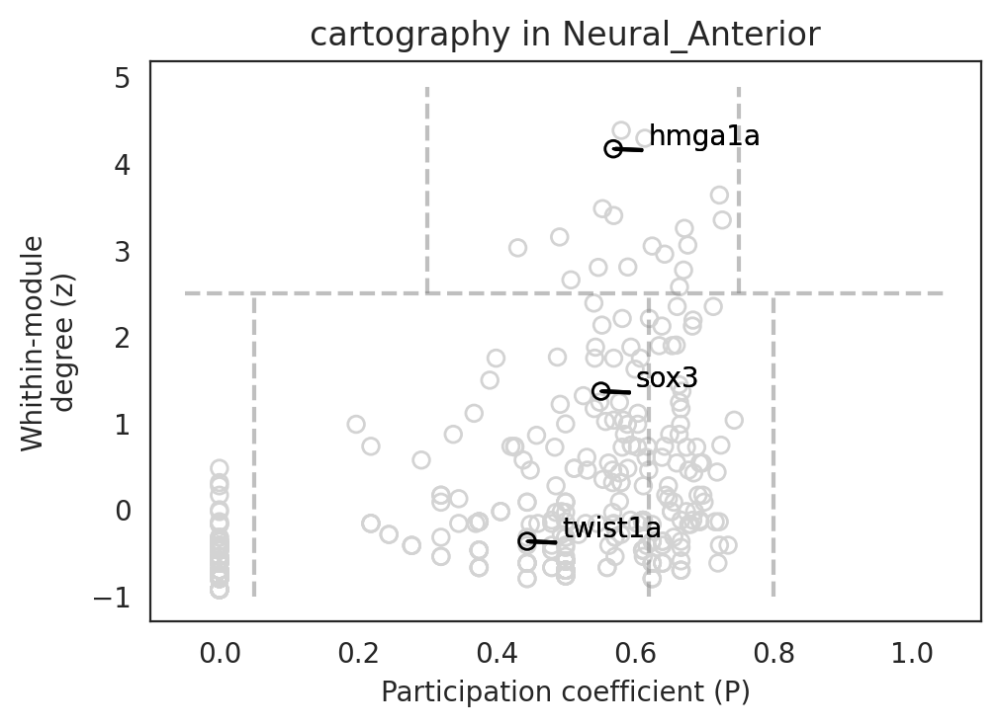

Neural_Crest


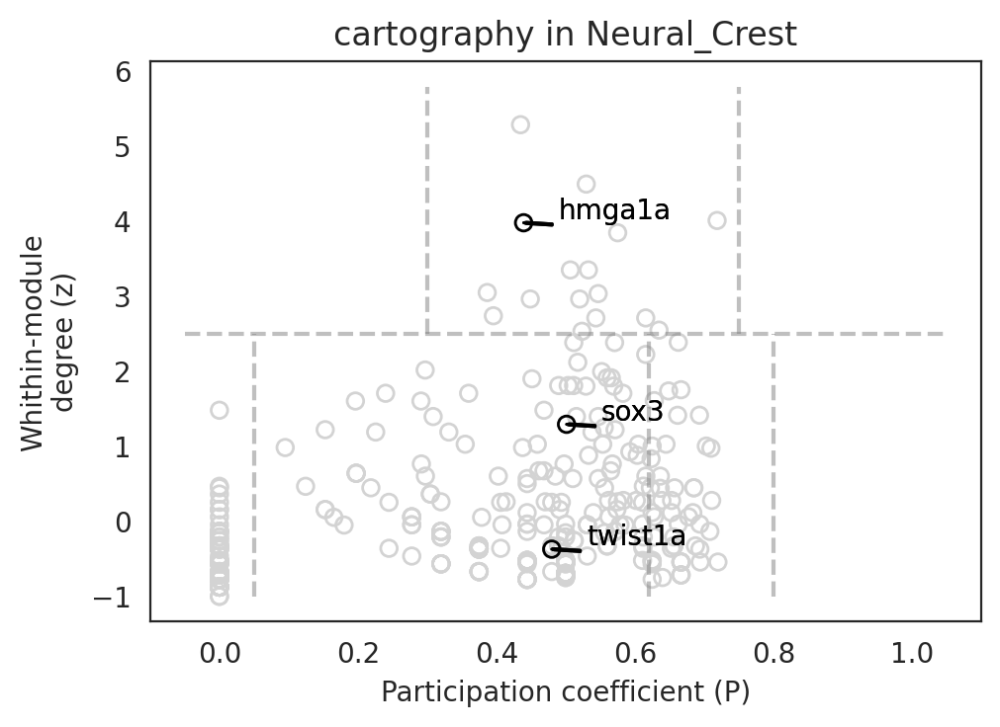

Neural_Posterior


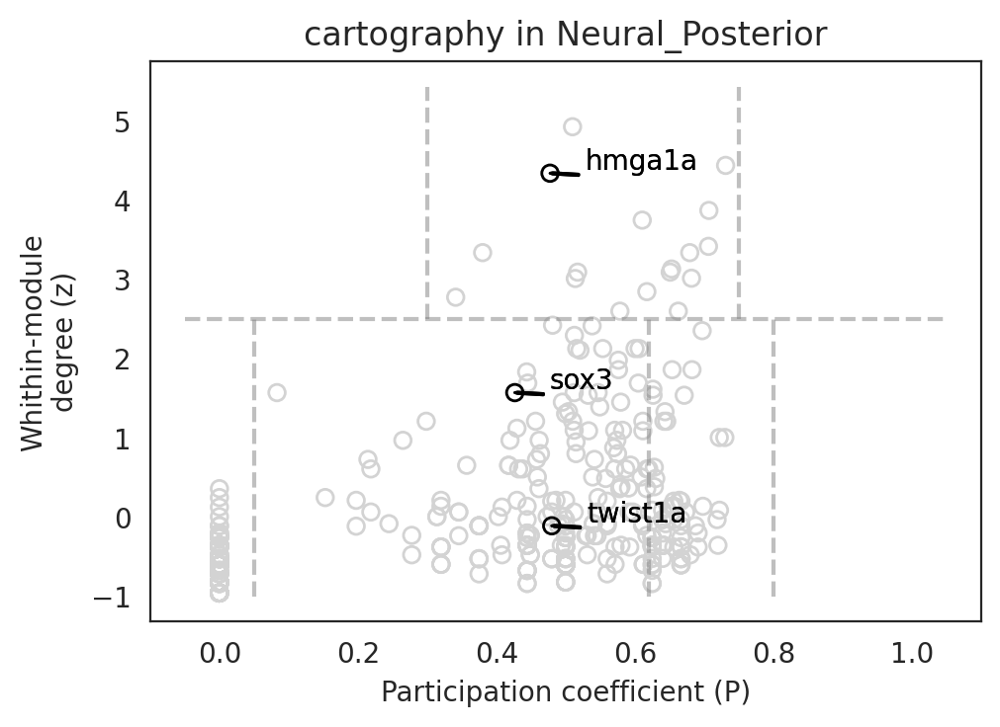

Notochord


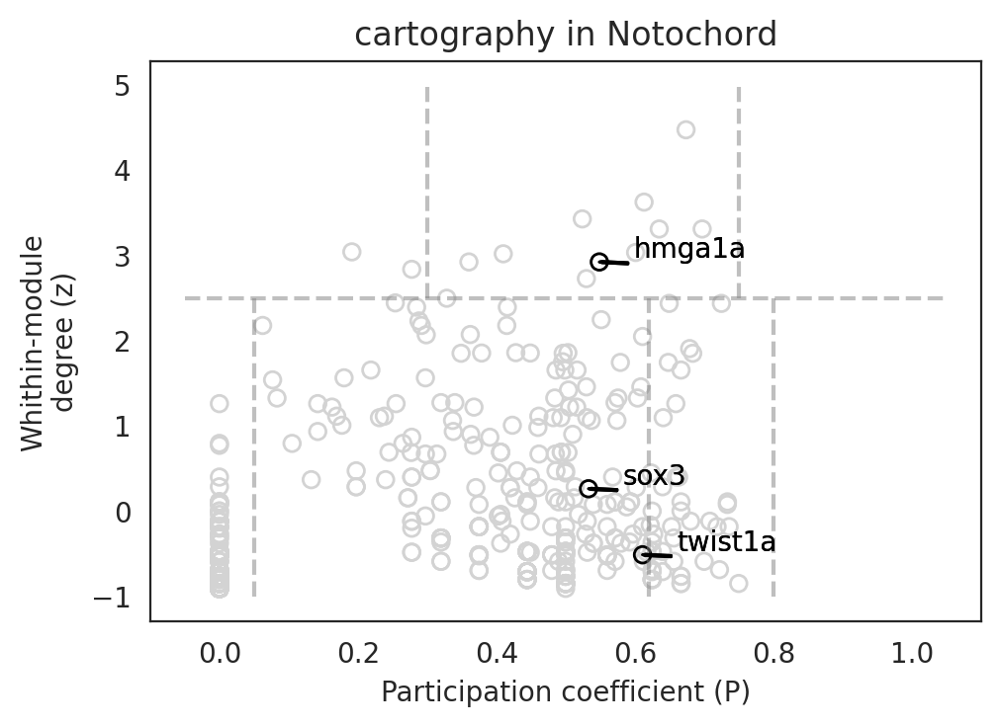

PSM


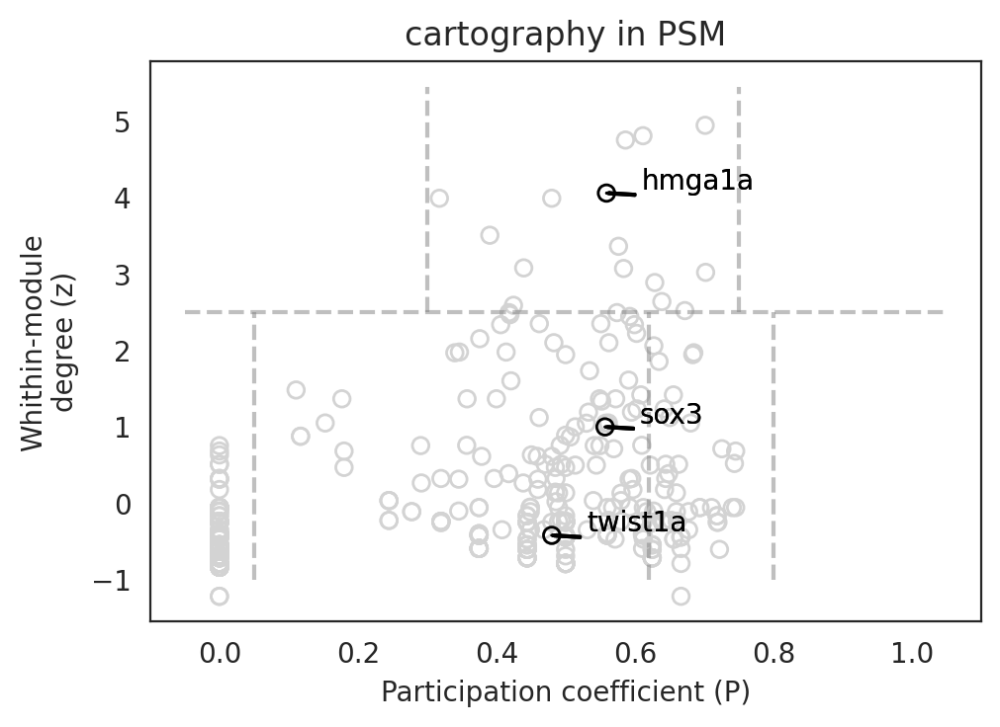

Somites


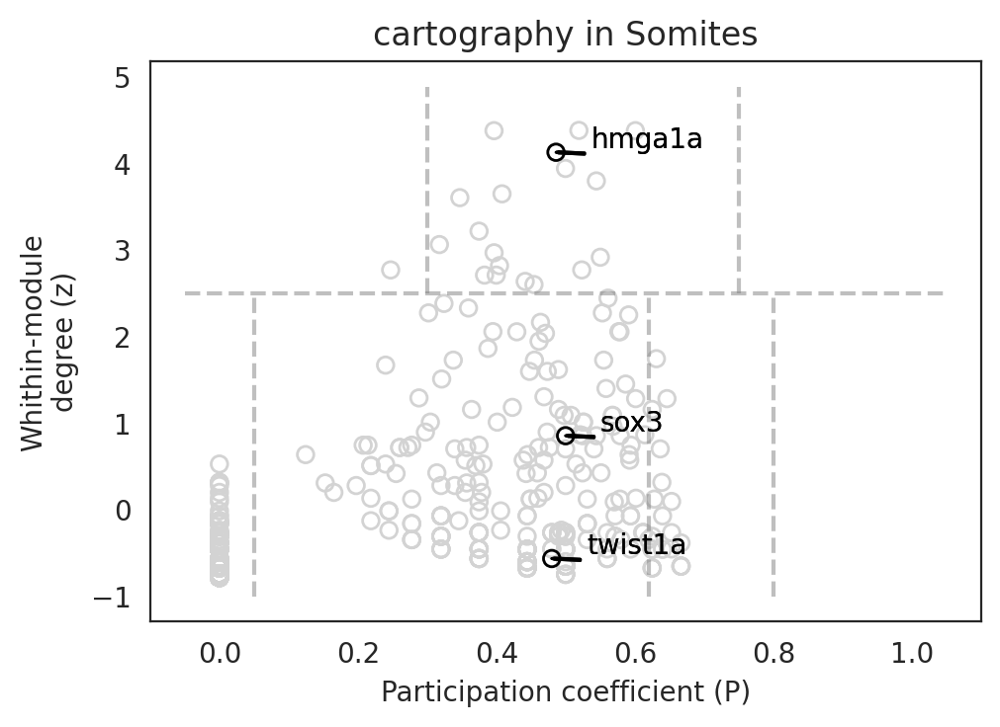

unassigned


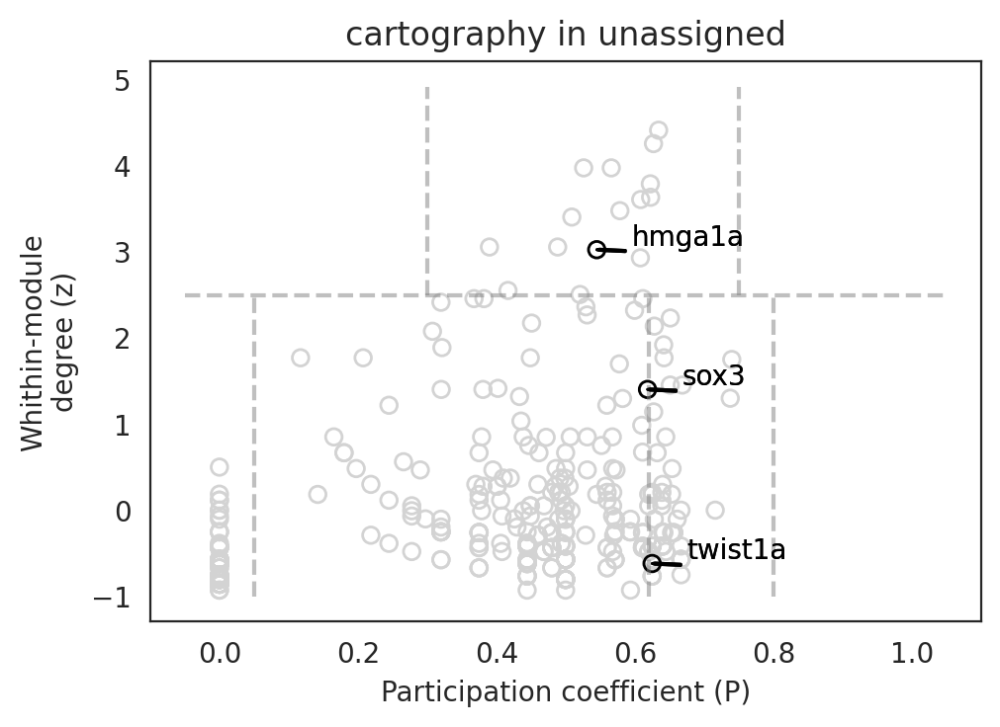

In [87]:
# Plot cartography as a scatter plot
links.plot_cartography_scatter_per_cluster(scatter=True,
                                           kde=False,
                                           gois=["hmga1a", "sox3", "twist1a"],
                                           auto_gene_annot=False,
                                           args_dot={"n_levels": 105},
                                           args_line={"c":"gray"}) #, save="TDR118_15somite_GRN_coarse_celltypes/cartography")

In [90]:
output_filepath

'/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/TDR118_cicero_output/'

In [92]:
# # Plot the summary of cartography analysis
# links.plot_cartography_term(goi="sox3", save= output_filepath + "figures_danRer11/cartography")

# 8. Network analysis; network score distribution

Next, we visualize the distribution of network score to get insight into the global trend of the GRNs.

## 8.1. Distribution of network degree

degree_centrality_all


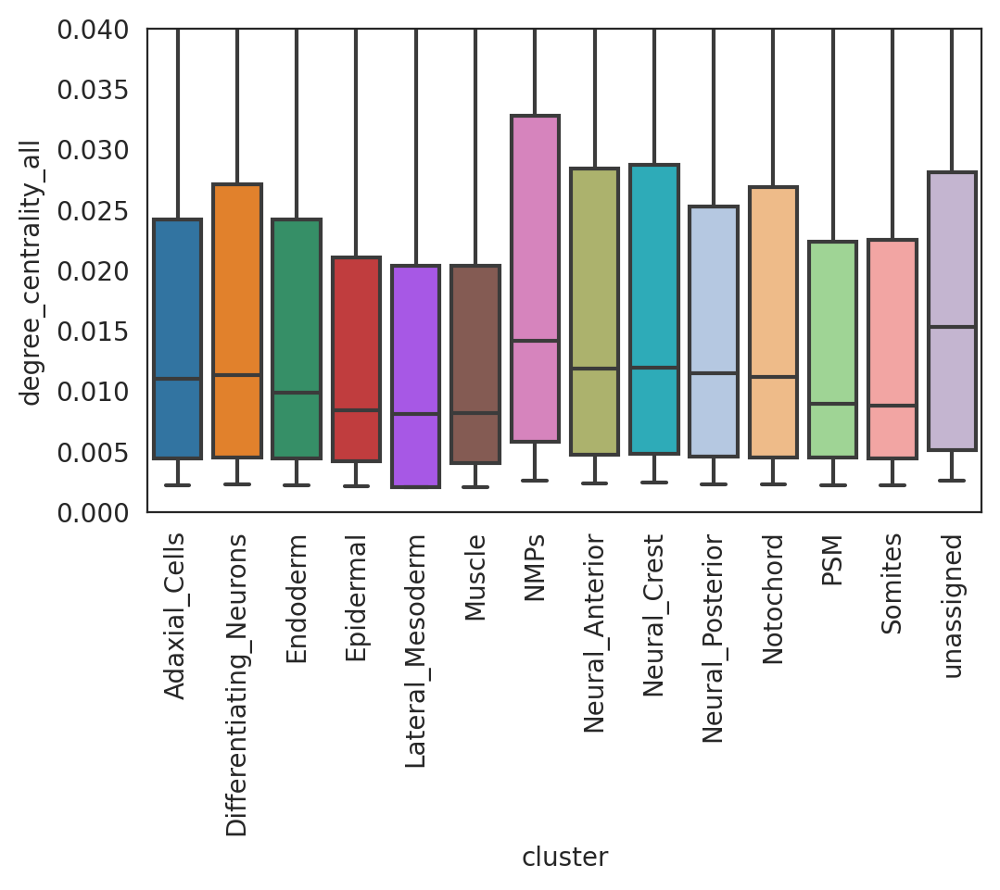

In [93]:
plt.subplots_adjust(left=0.15, bottom=0.3)
plt.ylim([0,0.040])
links.plot_score_discributions(values=["degree_centrality_all"], method="boxplot")#, save="TDR118_15somite_GRN_coarse_celltypes")



eigenvector_centrality


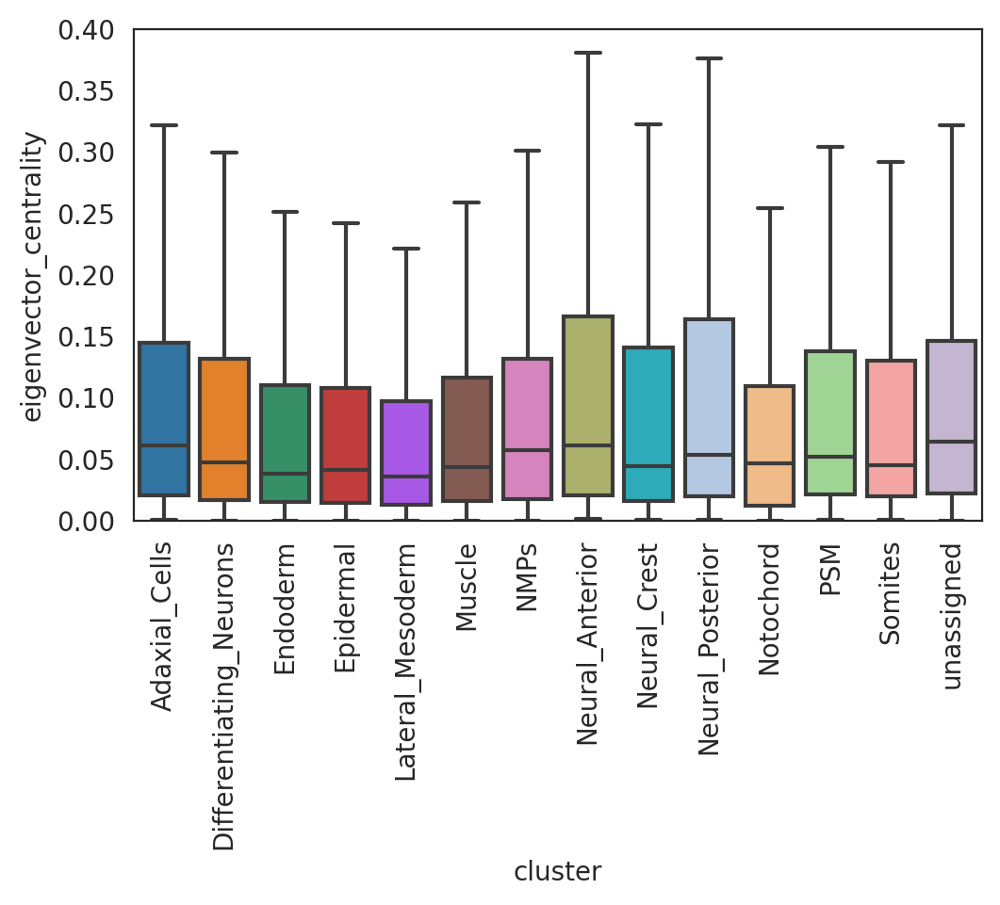

In [94]:
plt.subplots_adjust(left=0.15, bottom=0.3)
plt.ylim([0, 0.40])
links.plot_score_discributions(values=["eigenvector_centrality"], method="boxplot")# , save="TDR118_15somite_GRN_coarse_celltypes")




## 8.2. Distribution of netowrk entropy

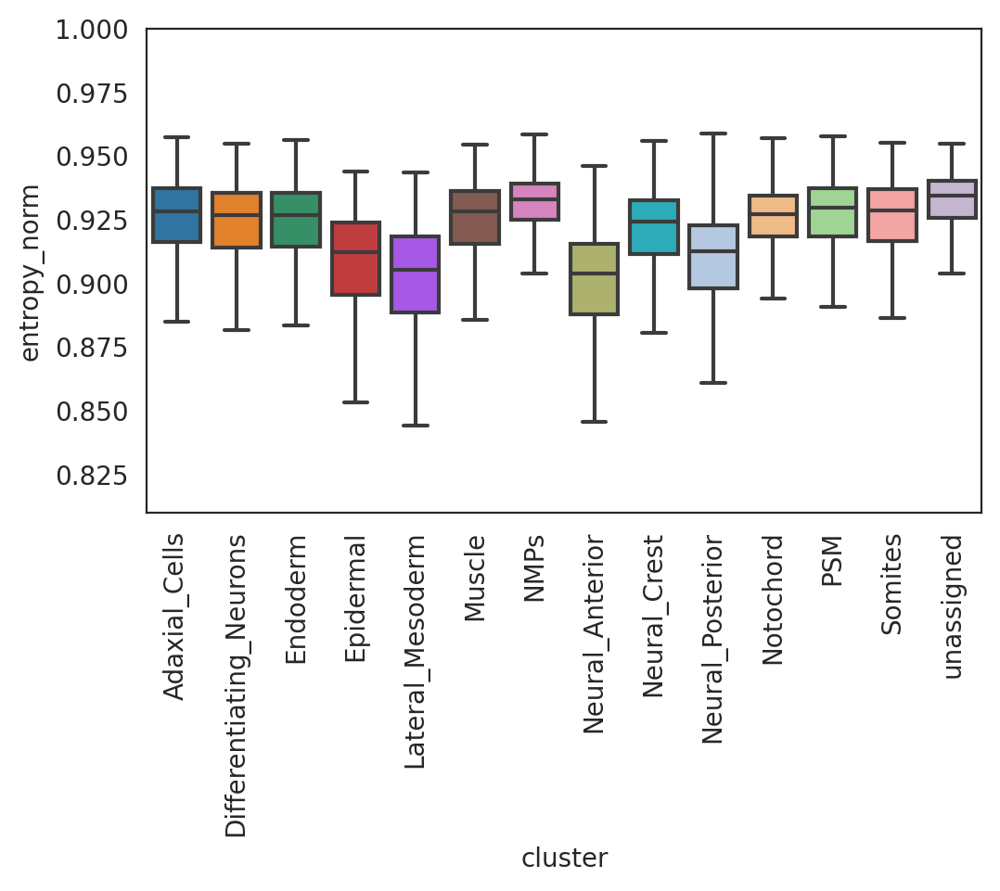

In [95]:
plt.subplots_adjust(left=0.15, bottom=0.3)
links.plot_network_entropy_distributions() #(save="TDR118_15somite_GRN_coarse_celltypes")



Using the network scores, we could pick up cluster-specific key TFs.
Gata2, Gata1, Klf1, E2f1, for example, are known to play an essential role in MEP, and these TFs showed high network score in our GRN.

However, it is important to note that network analysis alone cannot shed light on the specific functions or roles these TFs play in cell fate determination. 

In the next section, we will begin to investigate each TF’s contribution to cell fate by running GRN simulations